**Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones**

**Edición 2021**

**Integrantes 'Grupo 2'**
* Iberra Yanina
* Junco Luis
* Wolfman Gabriel

---
## Mentoría Data Science aplicado a BCI

## Consignas TP1: Análisis y Visualización

### Parte I: Exploración de la base de datos.

#### A) Leer los datos, eliminar los metadatos innecesarios.

Descripción de cada columna:
- Una primer columna de cuenta de muestras,
- Cuatro columnas con los datos de cada canal,
- Tres columnas con las mediciones de acelerómetros presentes en la placa Ganglion (no utilizados en estos estudios),
- Una columna de etiquetas (serán descritas a continuación),
- Una columna de marcas temporales,
- Una última columna de etiquetas temporales utilizadas por el Software OpenBCI para reproducir las señales posteriormente (tampoco utilizadas en este estudio).

Metadatos:
- OpenBCI Raw EEG Data
- Number of channels = 4
- Sample Rate = 200.0 Hz
- First Column = SampleIndex
- Last Column = Timestamp 
- Second to last column = stimulus/prediction tags
- TAG CODE:
  - During calibration: 0 --> not looking; 1 --> looking left; 2 --> looking right, 99 --> NaN (default value)
  - During prediction (idem calibration + 10): 10 --> not looking; 11 --> looking left; 12 --> looking right
- Other Columns = EEG data in microvolts followed by Accel Data (in G) interleaved with Aux Data

In [1]:
import io
import matplotlib                   
import matplotlib.pyplot as plt
import numpy
import pandas as pd
import seaborn as sns
import statsmodels.stats.api as sms
import scipy 
import math
from sklearn.linear_model import LinearRegression

plt.style.use('ggplot')
%matplotlib inline
sns.set_context('talk')
sns.set_palette('pastel') 

sns.set_context("paper", rc={"font.size":12,"axes.titlesize":12,"axes.labelsize":12}) 

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# Al ejecutar el código, se mostrará un link, al cual se debe acceder 
# con la cuenta de correo (personal) autorizada en el drive compartido

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

def connect_to_drive():
    auth.authenticate_user()
    gauth = GoogleAuth()
    gauth.credentials = GoogleCredentials.get_application_default()
    return GoogleDrive(gauth)

def read_csv_from_drive(drive, id, filename, skiprows=None, names=None):
    downloaded = drive.CreateFile({'id':id}) 
    downloaded.GetContentFile(filename)  
    return pd.read_csv(filename, skiprows=skiprows, names=names)

drive = connect_to_drive()

Leemos los 7 archivos correspondientes al registro de 7 sesiones, en las que participaron 4 individuos (AA, HA, JA y MA).

Eliminamos las primeras 10 líneas de cada archivo, ya que contienen descripciones del hardware y software utilizados, y no las mediciones propiamente dichas.

In [3]:
columns_names = ["num_muestra","canal1","canal2","canal3","canal4","acelero1","acelero2","acelero3","etiqueta","marca_temporal","marc_temp_sw"]
delete_rows= 10

df_AA0 = read_csv_from_drive(drive, '1rC224X_cyTLIJFeY0vj3_6A85YwFVztX' , 'AA_0_-_2020-10-28.csv', skiprows=None, names=columns_names)
df_AA1 = read_csv_from_drive(drive, '1nfYbsq3AefNxLPZFwaLMEkWqlEDshdbp' , 'AA_1_-_2020-11-24.csv', skiprows=delete_rows, names=columns_names)
df_AA2 = read_csv_from_drive(drive, '1X4xCoXB36EvT4roR4XbwWLzB9fFUq9-2' , 'AA_2_-_2020-11-24.csv', skiprows=delete_rows, names=columns_names)

df_HA1 = read_csv_from_drive(drive, '1bnM3or_5nxAJFvnMV0HlDrrq6iH4fZCd' , 'HA_1_-_2020-11-24.csv', skiprows=delete_rows, names=columns_names)

df_JA1 = read_csv_from_drive(drive, '1y5P7NJdVn0_CgVAQmAfoMeirv4EYX8tR' , 'JA_1_-_2020_-_11-19.csv', skiprows=delete_rows, names=columns_names)
df_JA2 = read_csv_from_drive(drive, '1mtqwOfqCfeQ-L_c7ndlwMqLv6q4mi1je' , 'JA_2_-_2020-11-24.csv', skiprows=delete_rows, names=columns_names)

df_MA1 = read_csv_from_drive(drive, '19pVv_vpsDTm2kHdi1pS2ESVb2DYwBdUn' , 'MA_1_-_2020-12-18.csv', skiprows=delete_rows, names=columns_names)

Agregaremos a cada dataframe dos nuevas columnas: 'persona', que indica el individuo al que corresponden las mediciones y 'sesion', que contiene el número de sesión en la que el individuo se realizó las mediciones, ya que una misma persona puede tener más de una sesión.

In [4]:
df_AA0['persona'] = 'AA'
df_AA0['sesion'] = 0
df_AA1['persona'] = 'AA'
df_AA1['sesion'] = 1
df_AA2['persona'] = 'AA'
df_AA2['sesion'] = 2

df_HA1['persona'] = 'HA'
df_HA1['sesion'] = 1

df_JA1['persona'] = 'JA'
df_JA1['sesion'] = 1
df_JA2['persona'] = 'JA'
df_JA2['sesion'] = 2

df_MA1['persona'] = 'MA'
df_MA1['sesion'] = 1

In [5]:
# Variable definitions
dfs = [df_AA0, df_AA1, df_AA2, df_HA1, df_JA1, df_JA2, df_MA1]
dfs_names = ['AA0', 'AA1', 'AA2', 'HA1', 'JA1', 'JA2', 'MA1']

In [6]:
# Unificamos todos los set de datos en un sólo dataframe
df = pd.concat(dfs, axis=0).reset_index()
display(df.shape)
df.tail(5)
# No hay un id único por registro (salvo el index), ya que "num_muestra" se repite en una misma sesión (Van del 0 al 200). 

(659112, 14)

,index,num_muestra,canal1,canal2,canal3,canal4,acelero1,acelero2,acelero3,etiqueta,marca_temporal,marc_temp_sw,persona,sesion
659107,69705,140,805.10,36.59,1370.61,1342.16,0.0,0.0,0.0,99,10:25:40.587,1608297940587,MA,1
659108,69706,141,809.05,27.30,1378.69,1340.12,0.0,0.0,0.0,99,10:25:40.589,1608297940589,MA,1
659109,69707,142,818.05,27.28,1384.75,1345.36,0.0,0.0,0.0,99,10:25:40.589,1608297940589,MA,1
659110,69708,143,810.54,31.55,1373.65,1334.40,0.0,0.0,0.0,99,10:25:40.590,1608297940590,MA,1
659111,69709,144,799.01,29.78,1368.15,1336.88,0.0,0.0,0.0,99,10:25:40.590,1608297940590,MA,1


In [7]:
# Delete no necessary columns for all dataframes
columns_to_delete = ['acelero1','acelero2','acelero3','marc_temp_sw']
df.drop(columns_to_delete, axis=1, inplace=True)
for d in dfs:
  d.drop(columns_to_delete, axis=1, inplace=True)

Tenemos ahora, además de cada dataframe, un único dataframe llamado df que contiene todas las series temporales (7), en el cual podemos identificar por la columna "persona" a qué individuo corresponde el registro y en 'sesion' el número de sesión.

#### B) Describir las características generales del dataset:
  - Número de registros, diferencias entre los mismos.
  - Definir conveniencia de trabajar todos juntos como un solo dataset, o por
  separado.

In [8]:
# Show shapes for each df, before delete 99 chanel values
i=0
for d in dfs:
  print(dfs_names[i] + ": ", len(d))
  i=i+1

AA0:  45973
AA1:  138169
AA2:  110384
HA1:  137693
JA1:  55860
JA2:  101323
MA1:  69710


In [9]:
# Número de registros por persona
df.groupby(['persona'])['num_muestra'].count()

persona
AA    294526
HA    137693
JA    157183
MA     69710
Name: num_muestra, dtype: int64

In [10]:
# Porcentajes de número de registros por persona
df.groupby(['persona'])['num_muestra'].count()/len(df)*100

persona
AA    44.685274
HA    20.890683
JA    23.847692
MA    10.576351
Name: num_muestra, dtype: float64

In [11]:
# Número de registros por persona y sesión
df.groupby(['persona', 'sesion'])['num_muestra'].count()

persona  sesion
AA       0          45973
         1         138169
         2         110384
HA       1         137693
JA       1          55860
         2         101323
MA       1          69710
Name: num_muestra, dtype: int64

Text(0.5, -0.35, 'Gráfico 1.1')

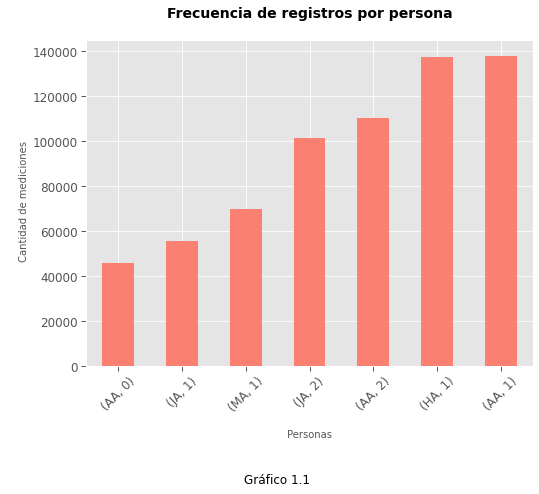

In [12]:
# Graficamos la distribución de frecuencias de las mediciones por personas, por sesion
fig = plt.figure(figsize=(8, 6))
#df.groupby(['persona'])['num_muestra'].count()\
df.groupby(['persona', 'sesion'])['num_muestra'].count()\
    .sort_values(ascending=True)\
    .plot.bar(color = "salmon")\
    .set_title('Frecuencia de registros por persona\n ', fontsize=14, weight='bold')
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.xlabel("\n Personas \n", fontsize=10)
plt.ylabel("\n Cantidad de mediciones", fontsize=10)
plt.annotate(
    'Gráfico 1.1', 
    xy = (0.5, -0.35), 
    xycoords='axes fraction', 
    ha='right', 
    va='center', 
    fontsize=12
)

In [13]:
# Veamos algunas métricas del dataset total
df.describe()

,index,num_muestra,canal1,canal2,canal3,canal4,etiqueta,sesion
count,659112.000000,659112.000000,659112.000000,659112.000000,659112.000000,659112.000000,659112.000000,659112.000000
mean,53552.123093,99.951186,1691.477557,973.629046,1849.865887,1770.617853,61.679091,1.251450
std,36072.588579,58.021817,1328.447764,1430.800717,1132.031308,1328.252703,47.385825,0.572471
min,0.000000,0.000000,-32227.040000,-27065.990000,-30160.930000,-46913.840000,1.000000,0.000000
25%,23539.000000,50.000000,1751.950000,805.050000,1814.200000,1803.420000,2.000000,1.000000
50%,47263.000000,100.000000,1876.150000,965.720000,1997.270000,1921.270000,99.000000,1.000000
75%,80697.000000,150.000000,2019.940000,1095.850000,2139.580000,2042.930000,99.000000,2.000000
max,138168.000000,200.000000,30263.940000,44839.750000,23036.750000,25123.480000,99.000000,2.000000


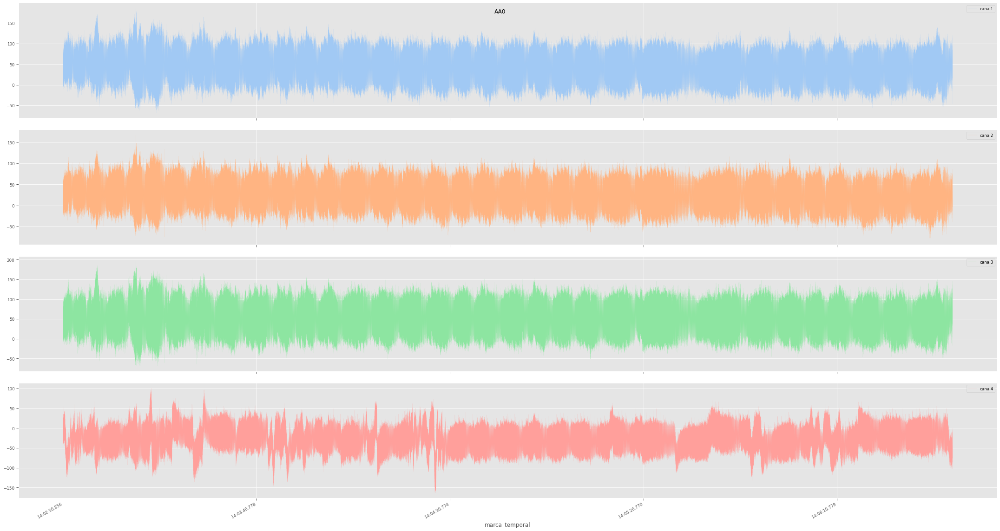

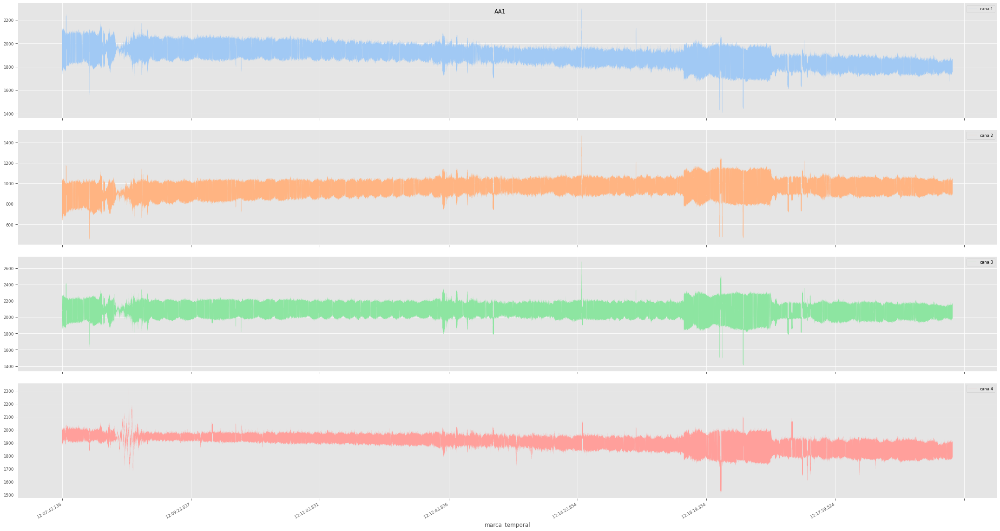

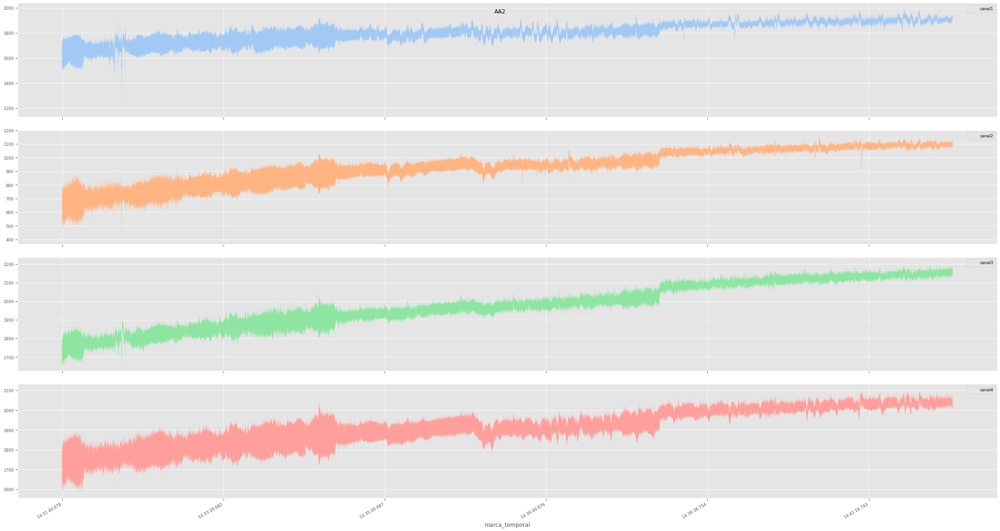

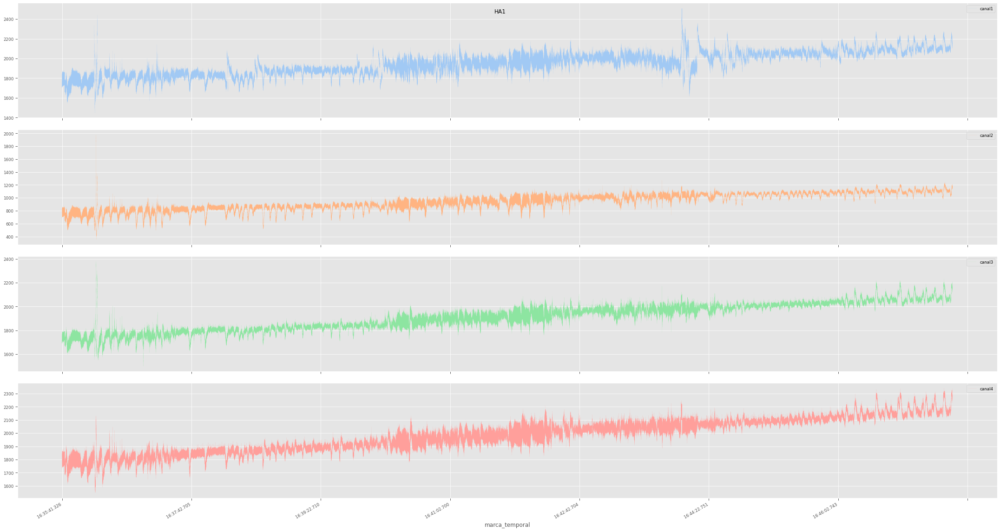

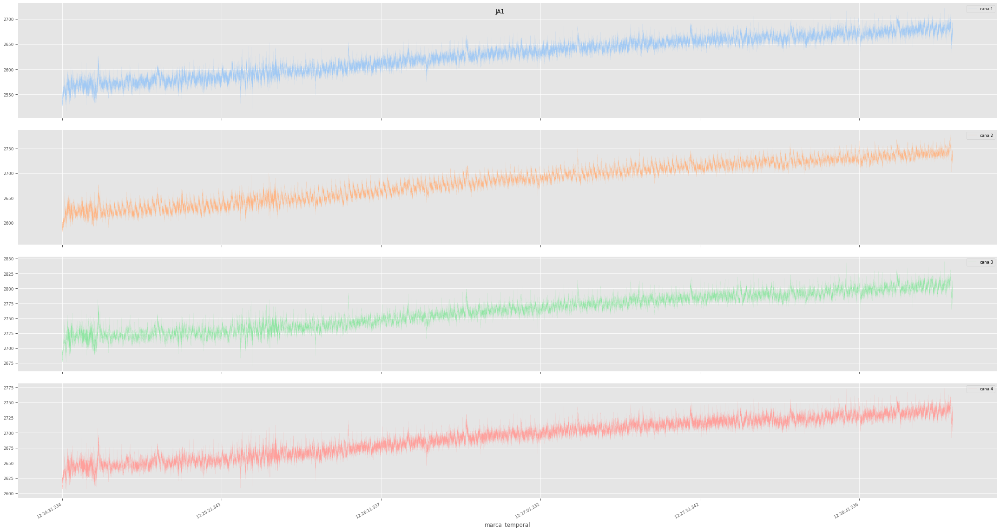

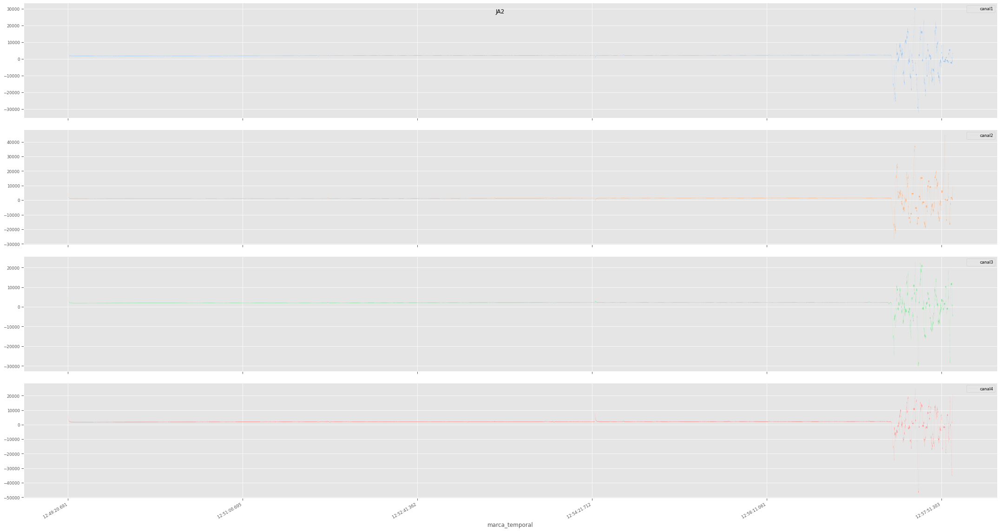

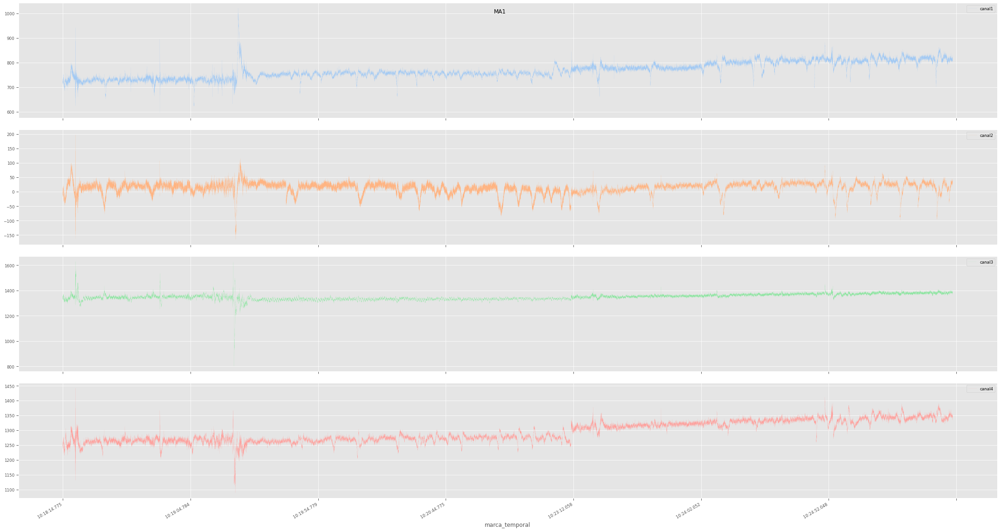

In [14]:
# Gráfica de los voltajes de cada canal en el tiempo por segmento (persona/sesión), antes de remover los 99.
dfs_names = ['AA0', 'AA1', 'AA2', 'HA1', 'JA1', 'JA2', 'MA1']
i=0
for d in dfs:
  d.plot(figsize=(30,16), subplots=True, x="marca_temporal", y=["canal1","canal2","canal3","canal4"], style='-', linewidth=0.1, title=dfs_names[i])
  i=i+1
  plt.tight_layout(h_pad=2)

**Observaciones:**

- Número de registros:
  - AA0: 45973
  - AA1: 138169
  - AA2: 110384 
  - HA1: 137693
  - JA1: 55860
  - JA2: 101323
  - MA1: 69710

  Muestras totales = 659112

  Todas las muestras contienen 11 columnas.

- Las mediciones de cada canal tienen rangos variados que oscilan entre los -46913.84 y 44839.75. Con medias entre 900 y 2000 aproximadamente, lo cual sugiere la presencia de valores extraños (ruido), que se analizarán en las secciones siguientes.
- Se decide trabajar con los df separados por persona/sesión, ya que se verifican rangos de voltajes distintos en cada caso y por lo tanto será conveniente trabajar cada dataset por separado. 
- Notamos cierto desbalanceo en los datos, ya que la persona 'AA' concentra el 44.7% de los datos, ya que tiene 3 sesiones, en lugar de una o dos como el resto de los individuos.


#### C) Analizar las columnas presentes en el dataset:
**¿Todas las columnas son relevantes? ¿Cuáles contienen información útil?**

No todas las columnas presentes en los dataset son relevantes para el análisis de éste estudio, por lo tanto se eliminaron en el punto A de la Parte I, las siguientes columnas:

  - Columnas con las mediciones de acelerómetros presentes en la placa Ganglion ('acelero1', 'acelero2', 'acelero3').
  - Columna de etiquetas temporales utilizadas por el Software OpenBCI para reproducir las señales posteriormente ('marc_temp_sw').

Se conservan las restantes columnas ('num_muestra', 'canal1', 'canal2', 'canal3', 'canal4', 'etiqueta', 'persona' y 'sesion'), ya que contienen información de las mediciones realizadas y los valores de las mismas.

  **¿Qué tipo de datos contienen? ¿Qué variables describen las columnas
  consideradas? ¿Con qué sensibilidad (el menor valor de variación de la señal que puede medir, microvoltios para los canales y microsegundos para el tiempo)?**

  Veamos los tipos de datos de cada columna del dataset.

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 659112 entries, 0 to 659111
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   index           659112 non-null  int64  
 1   num_muestra     659112 non-null  int64  
 2   canal1          659112 non-null  float64
 3   canal2          659112 non-null  float64
 4   canal3          659112 non-null  float64
 5   canal4          659112 non-null  float64
 6   etiqueta        659112 non-null  int64  
 7   marca_temporal  659112 non-null  object 
 8   persona         659112 non-null  object 
 9   sesion          659112 non-null  int64  
dtypes: float64(4), int64(4), object(2)
memory usage: 50.3+ MB


Convertimos la variable 'marca_temporal' a tipo 'datetime'.

In [16]:
# Eliminamos espacios en la columna 'marca_temporal'
df['marca_temporal'] = df['marca_temporal'].str.strip()
  # Formateamos la columna 'marca_temporal' a datetime en todos los dataframes
df['marca_temporal'] = pd.to_datetime(df['marca_temporal'],format='%H:%M:%S.%f')
for d in dfs:
  d['marca_temporal'] = d['marca_temporal'].str.strip()
  d['marca_temporal'] = pd.to_datetime(d['marca_temporal'],format='%H:%M:%S.%f')

Eliminamos los valores '99' de la columna 'etiqueta', ya que es un default value del aparato de medición, para los intervalos de no estimulación.

In [17]:
# Eliminamos los valores '99' de la etiqueta en todos los dataframes.
len_df=len(df)
print("Cantidad total de registros antes de remover las etiquetas con valor 99: %i \n" % len_df)
df = df.drop(df[df['etiqueta']==99].index)
df_AA0 = df_AA0.drop(df_AA0[df_AA0['etiqueta']==99].index)
df_AA1 = df_AA1.drop(df_AA1[df_AA1['etiqueta']==99].index)
df_AA2 = df_AA2.drop(df_AA2[df_AA2['etiqueta']==99].index)
df_HA1 = df_HA1.drop(df_HA1[df_HA1['etiqueta']==99].index)
df_JA1 = df_JA1.drop(df_JA1[df_JA1['etiqueta']==99].index)
df_JA2 = df_JA2.drop(df_JA2[df_JA2['etiqueta']==99].index)
df_MA1 = df_MA1.drop(df_MA1[df_MA1['etiqueta']==99].index)
len_df_without99= len(df)
dif_len = len_df-len_df_without99
print("Cantidad de registros eliminados: {} ({:.2f}%) \n".format(dif_len, dif_len/len_df*100))
print("Tamaño del dataset después de remover las etiquetas con valor 99: %i \n" % len_df_without99)

Cantidad total de registros antes de remover las etiquetas con valor 99: 659112 

Cantidad de registros eliminados: 406775 (61.72%) 

Tamaño del dataset después de remover las etiquetas con valor 99: 252337 



In [18]:
# Show shapes for each df, after delete 99 chanel values
dfs = [df_AA0, df_AA1, df_AA2, df_HA1, df_JA1, df_JA2, df_MA1]
i=0
for d in dfs:
  print(dfs_names[i] + ": ", len(d))
  i=i+1

AA0:  29448
AA1:  52541
AA2:  39959
HA1:  39965
JA1:  25241
JA2:  39926
MA1:  25257


Text(0.5, -0.35, 'Gráfico 1.2')

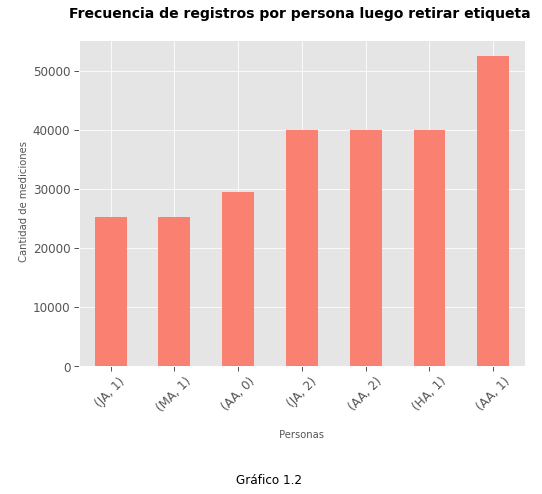

In [19]:
# Graficamos la distribución de frecuencias de las mediciones por personas, por sesion
fig = plt.figure(figsize=(8, 6))
#df.groupby(['persona'])['num_muestra'].count()\
df.groupby(['persona', 'sesion'])['num_muestra'].count()\
    .sort_values(ascending=True)\
    .plot.bar(color = "salmon")\
    .set_title('Frecuencia de registros por persona luego retirar etiqueta \n ', fontsize=14, weight='bold')
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.xlabel("\n Personas \n", fontsize=10)
plt.ylabel("\n Cantidad de mediciones", fontsize=10)
plt.annotate(
    'Gráfico 1.2', 
    xy = (0.5, -0.35), 
    xycoords='axes fraction', 
    ha='right', 
    va='center', 
    fontsize=12
)

In [20]:
df.describe()

,index,num_muestra,canal1,canal2,canal3,canal4,etiqueta,sesion
count,252337.000000,252337.000000,252337.000000,252337.000000,252337.000000,252337.000000,252337.000000,252337.000000
mean,58703.448916,99.957767,1667.503395,988.598000,1824.378544,1747.790701,1.516638,1.199880
std,35726.889180,58.128436,737.289368,720.146092,727.821067,725.215116,0.499724,0.627161
min,8806.000000,0.000000,-55.230000,-100.370000,-55.200000,-146.640000,1.000000,0.000000
25%,30581.000000,50.000000,1759.580000,826.550000,1809.020000,1811.790000,1.000000,1.000000
50%,46233.000000,100.000000,1881.590000,991.020000,2036.570000,1926.890000,2.000000,1.000000
75%,86595.000000,150.000000,2046.460000,1138.090000,2156.950000,2072.860000,2.000000,2.000000
max,137899.000000,200.000000,2721.300000,2770.820000,2845.010000,2773.500000,2.000000,2.000000


**Observaciones:**

- Se tienen 6 variables numéricas y 2 que son consideradas 'object' por contener strings (incluida la marca temporal que transformamos a un tipo de dato 'datetime 64[ns]' para poder realizar los gráficos de la señal en función del tiempo).
- La columna de **tiempo** indica en qué momento de tiempo fue realizada cada muestra (en formato HH:MM:SS.MS), cuenta con una sensibilidad de milisegundos.
- La columna **'num_muestra'** identifica cada muestra con valores que van desde el 0 al 200 y luego vuelve a reiniciarse (notar que cuentan con 201 valores antes de reiniciar el contador).
- Las 4 columnas de los **canales** son los provenientes de los electrodos dispuestos en la zona occipital del encéfalo (de manera no invasiva) las cuales expresan la activación de la zona con un cierto voltaje. Luego de eliminar los registros con etiqueta '99', Los canales toman valores que van desde un mínimo -146 (en el canal 4) a un máximo de 2845 (en el canal 3). Las columnas de los canales muestran el voltaje de la señal muestreada con una sensibilidad de micro Volt.
- La variable **etiqueta**, si bien en python se interpreta como entero, la trabajaremos como una variable categórica, ya que tiene dos valores posibles (1 y 2). Nos indica la luz observada por el individuo de prueba, teniendo dos luces de distinta frecuencia. El valor '1' de la etiqueta se asigna a la luz parpadeante a 12,5 Hz y el '2' para la de 16,5 Hz. Los valores con etiqueta 99 fueron removidos ya que es cuando el individuo no observa ninguna luz. 


  **En el caso de los datos cualitativos. ¿Cuáles son los valores posibles para
  esta variable? Describa su presencia (frecuencia, intervalos, secuencia, etc.)**

Los datos cualitativos son:
- 'etiqueta' con valores:
  - 1: looking left;
  - 2: looking right;
- 'person'
- 'sesion'

**Para todas las columnas, ¿hay datos dañados? ¿valores nulos? ¿qué
  estrategia considera más pertinente para abordar esos datos? Justifique.**

In [21]:
df.isnull().sum() # En caso de que hubiera, en el caso del tiempo, al ser una señal, se podría interpolar con los valores cercanos (anteror y posterior)

index             0
num_muestra       0
canal1            0
canal2            0
canal3            0
canal4            0
etiqueta          0
marca_temporal    0
persona           0
sesion            0
dtype: int64

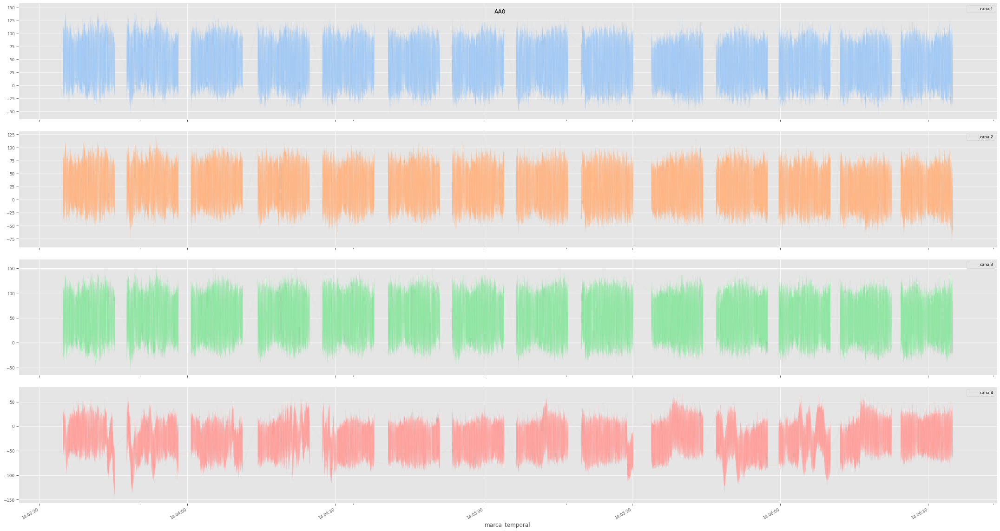

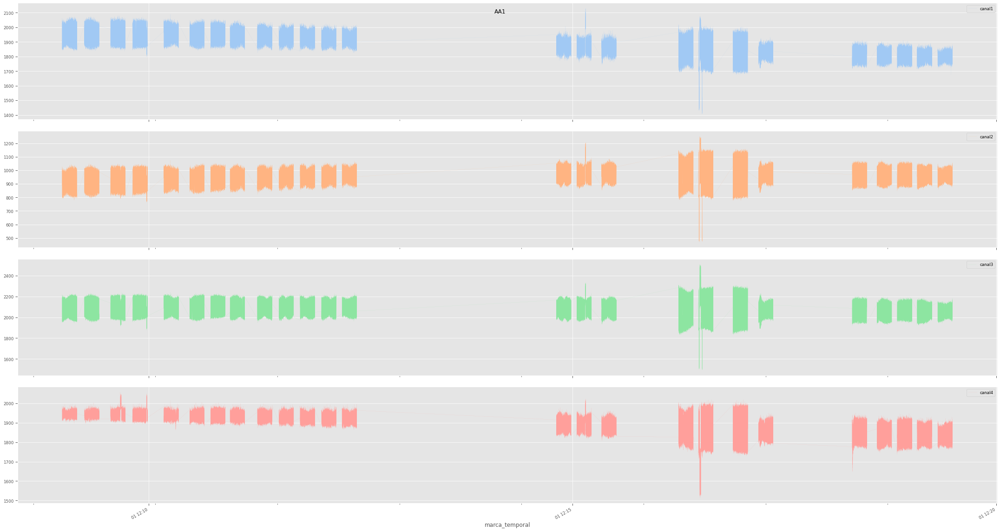

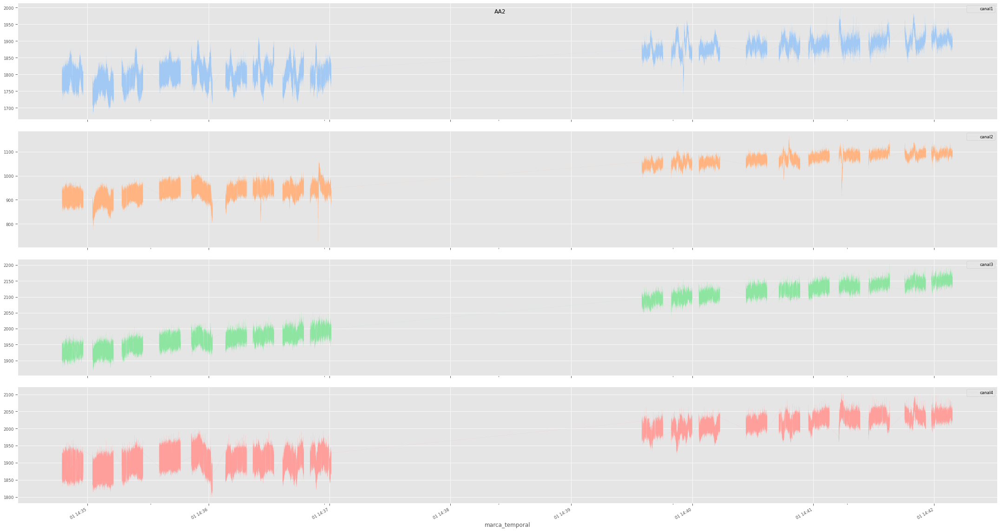

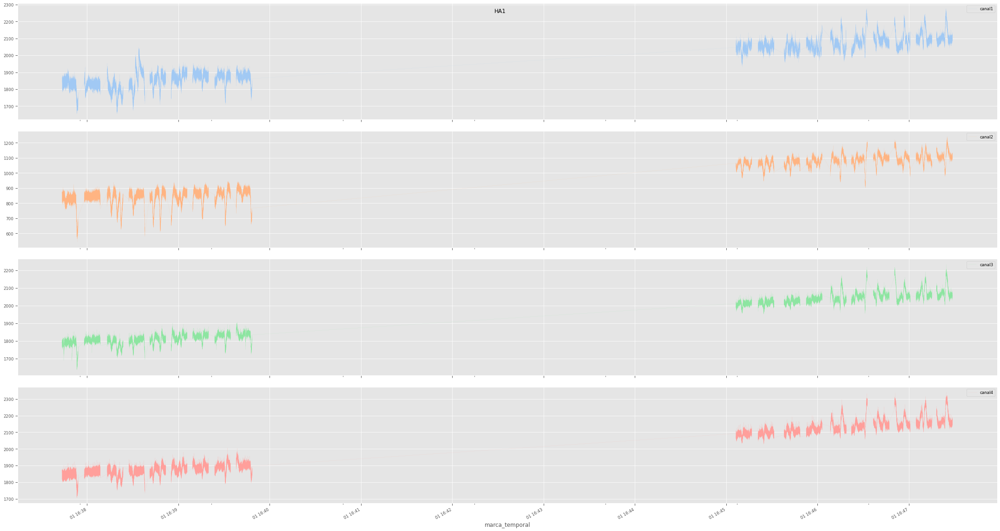

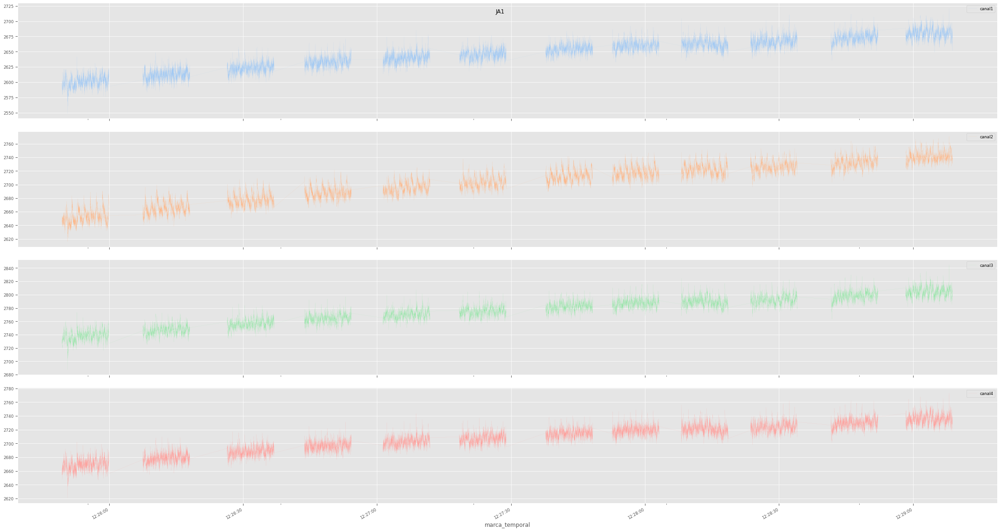

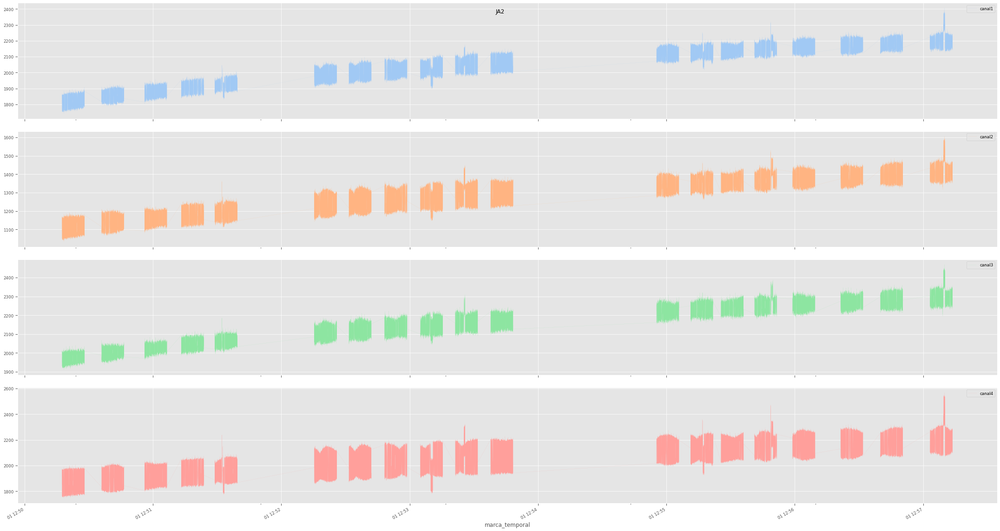

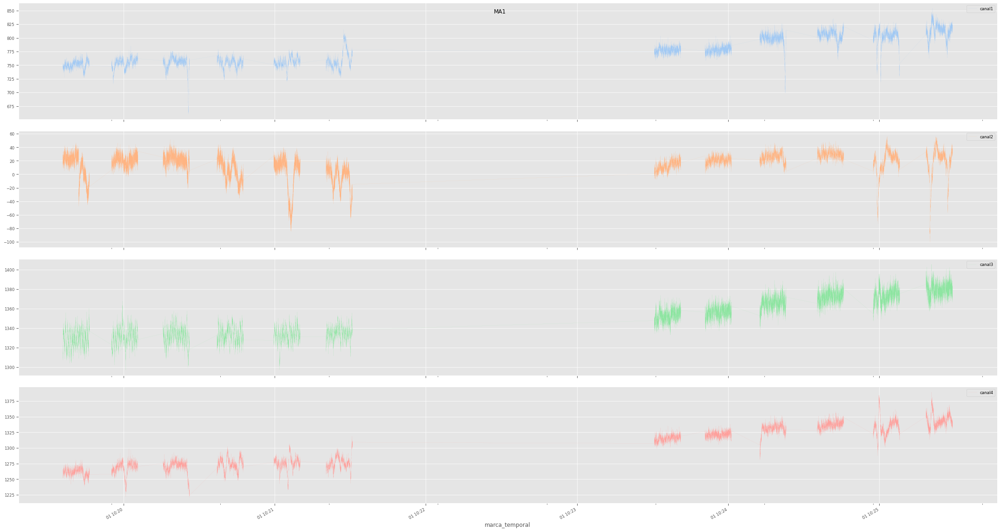

In [22]:
# Gráfica de los voltajes de cada canal en el tiempo por segmento (persona/sesión), después de remover los 99.
dfs_names = ['AA0', 'AA1', 'AA2', 'HA1', 'JA1', 'JA2', 'MA1']
i=0
for d in dfs:
  d.plot(figsize=(30,16), subplots=True, x="marca_temporal", y=["canal1","canal2","canal3","canal4"], style='-', linewidth=0.1, title=dfs_names[i])
  i=i+1
  plt.tight_layout(h_pad=2)

Al ver los rangos de valores (min, max) para cada persona/sesión y para cada canal, se observan rangos que tienen una gran variabilidad de valores de microvoltajes, aún entre mismas personas en diferentes sesiones.
También se evidencian diferentes outliers para cada uno de los segmentos mencionados.

Enfocaremos el tratamiento de éstos rangos dispares, para cada segmento, mediante **"Detrend by Model Fitting"**.

Antes de ello, veamos las distribuciones de cada segmento.

**Distribuciones antes de restar la linea de tendencia**

In [23]:
color_ch1 = 'red'
color_ch2 = 'green'
color_ch3 = 'blue'
color_ch4 = 'orange'

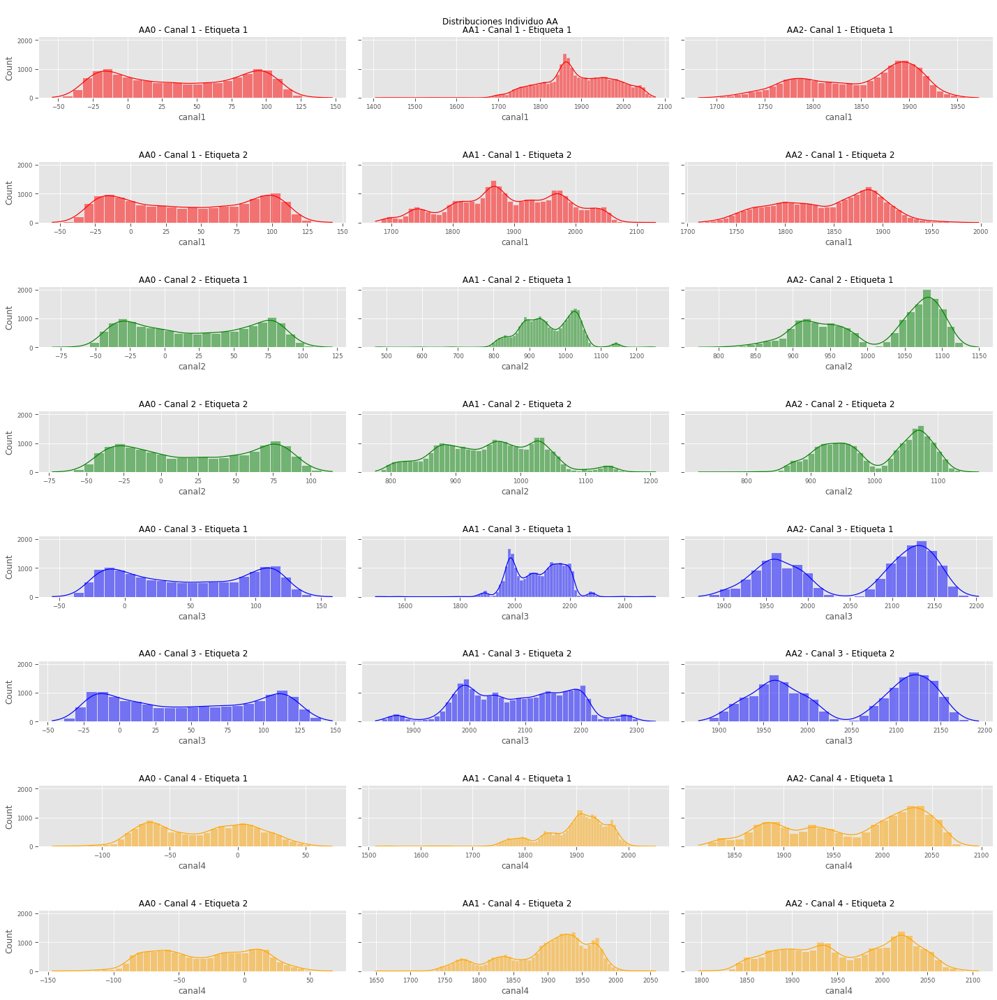

In [24]:
# AA - Canal 1 - Etiqueta 1 y Etiqueta 2
# Se grafica la distribución de los valores de voltaje
fig, axes = plt.subplots(8, 3, figsize=(20, 20), sharey=True)
fig.suptitle('Distribuciones Individuo AA')

canal = "canal1"
color_ch = color_ch1
sns.histplot(ax=axes[0, 0], x=df_AA0[df_AA0['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 0].set_title("\n\n AA0 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 1], x=df_AA1[df_AA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 1].set_title("\n\n AA1 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 2], x=df_AA2[df_AA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 2].set_title("\n\n AA2- Canal 1 - Etiqueta 1")

sns.histplot(ax=axes[1, 0], x=df_AA0[df_AA0['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 0].set_title("\n\n AA0 - Canal 1 - Etiqueta 2")
sns.histplot(ax=axes[1, 1], x=df_AA1[df_AA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 1].set_title("\n\n AA1 - Canal 1 - Etiqueta 2")
sns.histplot(ax=axes[1, 2], x=df_AA2[df_AA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 2].set_title("\n\n AA2 - Canal 1 - Etiqueta 2")

canal = "canal2"
color_ch = color_ch2
sns.histplot(ax=axes[2, 0], x=df_AA0[df_AA0['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 0].set_title("\n\n AA0 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[2, 1], x=df_AA1[df_AA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 1].set_title("\n\n AA1 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[2, 2], x=df_AA2[df_AA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 2].set_title("\n\n AA2- Canal 2 - Etiqueta 1")

sns.histplot(ax=axes[3, 0], x=df_AA0[df_AA0['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 0].set_title("\n\n AA0 - Canal 2 - Etiqueta 2")
sns.histplot(ax=axes[3, 1], x=df_AA1[df_AA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 1].set_title("\n\n AA1 - Canal 2 - Etiqueta 2")
sns.histplot(ax=axes[3, 2], x=df_AA2[df_AA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 2].set_title("\n\n AA2 - Canal 2 - Etiqueta 2")

canal = "canal3"
color_ch = color_ch3
sns.histplot(ax=axes[4, 0], x=df_AA0[df_AA0['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 0].set_title("\n\n AA0 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[4, 1], x=df_AA1[df_AA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 1].set_title("\n\n AA1 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[4, 2], x=df_AA2[df_AA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 2].set_title("\n\n AA2- Canal 3 - Etiqueta 1")

sns.histplot(ax=axes[5, 0], x=df_AA0[df_AA0['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 0].set_title("\n\n AA0 - Canal 3 - Etiqueta 2")
sns.histplot(ax=axes[5, 1], x=df_AA1[df_AA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 1].set_title("\n\n AA1 - Canal 3 - Etiqueta 2")
sns.histplot(ax=axes[5, 2], x=df_AA2[df_AA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 2].set_title("\n\n AA2 - Canal 3 - Etiqueta 2")

canal = "canal4"
color_ch = color_ch4
sns.histplot(ax=axes[6, 0], x=df_AA0[df_AA0['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 0].set_title("\n\n AA0 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[6, 1], x=df_AA1[df_AA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 1].set_title("\n\n AA1 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[6, 2], x=df_AA2[df_AA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 2].set_title("\n\n AA2- Canal 4 - Etiqueta 1")

sns.histplot(ax=axes[7, 0], x=df_AA0[df_AA0['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 0].set_title("\n\n AA0 - Canal 4 - Etiqueta 2")
sns.histplot(ax=axes[7, 1], x=df_AA1[df_AA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 1].set_title("\n\n AA1 - Canal 4 - Etiqueta 2")
sns.histplot(ax=axes[7, 2], x=df_AA2[df_AA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 2].set_title("\n\n AA2 - Canal 4 - Etiqueta 2")

plt.tight_layout()

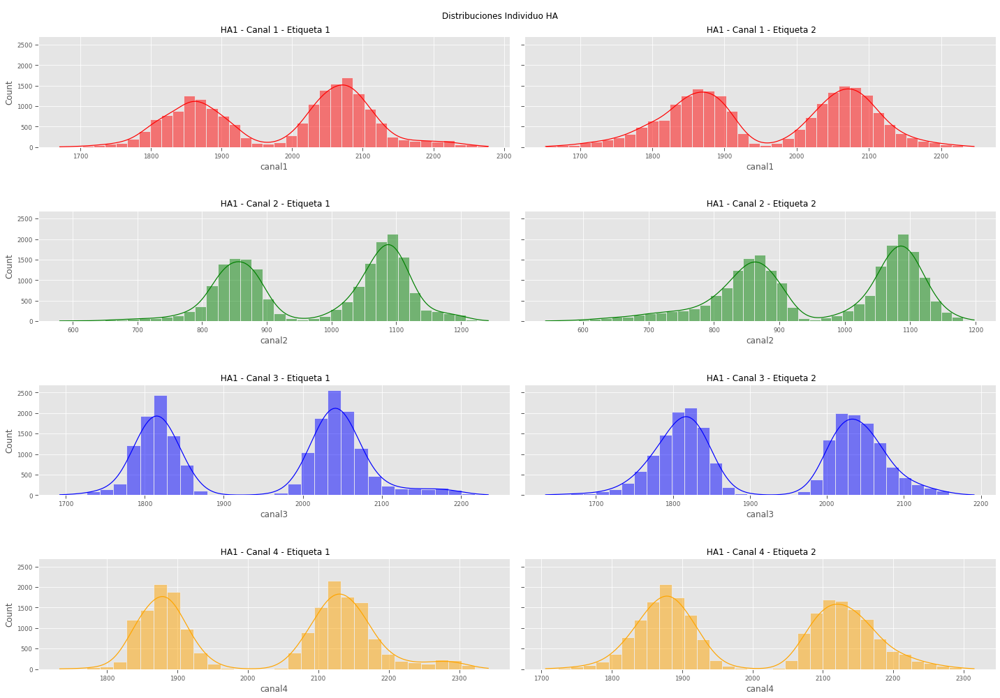

In [25]:
# HA - Canal 1 - Etiqueta 1 y Etiqueta 2
# Se grafica la distribución de los valores de voltaje
fig, axes = plt.subplots(4, 2, figsize=(20, 14), sharey=True)
fig.suptitle('Distribuciones Individuo HA')

canal = "canal1"
color_ch = color_ch1
sns.histplot(ax=axes[0, 0], x=df_HA1[df_HA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 0].set_title("\n\n HA1 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 1], x=df_HA1[df_HA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[0, 1].set_title("\n\n HA1 - Canal 1 - Etiqueta 2")

canal = "canal2"
color_ch = color_ch2
sns.histplot(ax=axes[1, 0], x=df_HA1[df_HA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[1, 0].set_title("\n\n HA1 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[1, 1], x=df_HA1[df_HA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 1].set_title("\n\n HA1 - Canal 2 - Etiqueta 2")

canal = "canal3"
color_ch = color_ch3
sns.histplot(ax=axes[2, 0], x=df_HA1[df_HA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 0].set_title("\n\n HA1 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[2, 1], x=df_HA1[df_HA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[2, 1].set_title("\n\n HA1 - Canal 3 - Etiqueta 2")

canal = "canal4"
color_ch = color_ch4
sns.histplot(ax=axes[3, 0], x=df_HA1[df_HA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[3, 0].set_title("\n\n HA1 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[3, 1], x=df_HA1[df_HA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 1].set_title("\n\n HA1 - Canal 4 - Etiqueta 2")

plt.tight_layout()

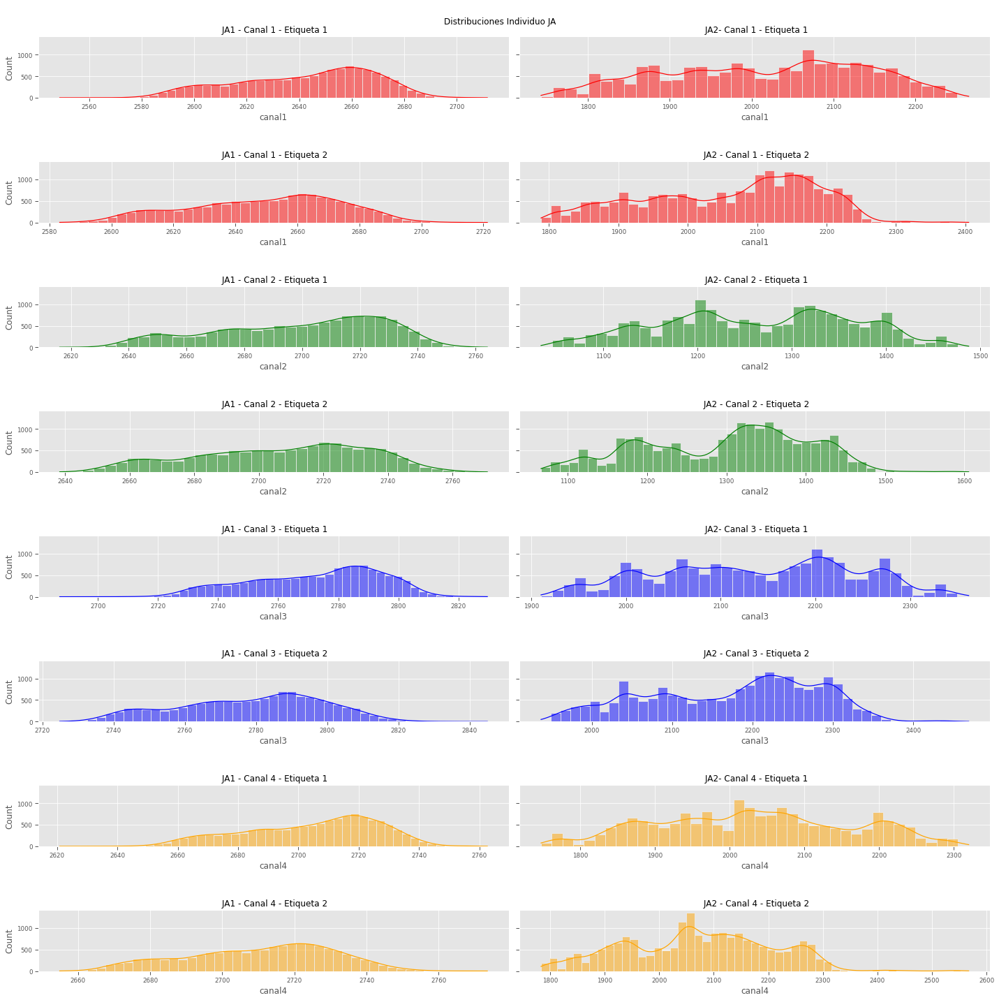

In [26]:
# JA - Canal 1 - Etiqueta 1 y Etiqueta 2
# Se grafica la distribución de los valores de voltaje
fig, axes = plt.subplots(8, 2, figsize=(20, 20), sharey=True)
fig.suptitle('Distribuciones Individuo JA')

canal = "canal1"
color_ch = color_ch1
sns.histplot(ax=axes[0, 0], x=df_JA1[df_JA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 0].set_title("\n\n JA1 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 1], x=df_JA2[df_JA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 1].set_title("\n\n JA2- Canal 1 - Etiqueta 1")

sns.histplot(ax=axes[1, 0], x=df_JA1[df_JA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 0].set_title("\n\n JA1 - Canal 1 - Etiqueta 2")
sns.histplot(ax=axes[1, 1], x=df_JA2[df_JA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 1].set_title("\n\n JA2 - Canal 1 - Etiqueta 2")

canal = "canal2"
color_ch = color_ch2
sns.histplot(ax=axes[2, 0], x=df_JA1[df_JA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 0].set_title("\n\n JA1 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[2, 1], x=df_JA2[df_JA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 1].set_title("\n\n JA2- Canal 2 - Etiqueta 1")

sns.histplot(ax=axes[3, 0], x=df_JA1[df_JA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 0].set_title("\n\n JA1 - Canal 2 - Etiqueta 2")
sns.histplot(ax=axes[3, 1], x=df_JA2[df_JA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 1].set_title("\n\n JA2 - Canal 2 - Etiqueta 2")

canal = "canal3"
color_ch = color_ch3
sns.histplot(ax=axes[4, 0], x=df_JA1[df_JA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 0].set_title("\n\n JA1 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[4, 1], x=df_JA2[df_JA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 1].set_title("\n\n JA2- Canal 3 - Etiqueta 1")

sns.histplot(ax=axes[5, 0], x=df_JA1[df_JA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 0].set_title("\n\n JA1 - Canal 3 - Etiqueta 2")
sns.histplot(ax=axes[5, 1], x=df_JA2[df_JA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 1].set_title("\n\n JA2 - Canal 3 - Etiqueta 2")

canal = "canal4"
color_ch = color_ch4
sns.histplot(ax=axes[6, 0], x=df_JA1[df_JA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 0].set_title("\n\n JA1 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[6, 1], x=df_JA2[df_JA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 1].set_title("\n\n JA2- Canal 4 - Etiqueta 1")

sns.histplot(ax=axes[7, 0], x=df_JA1[df_JA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 0].set_title("\n\n JA1 - Canal 4 - Etiqueta 2")
sns.histplot(ax=axes[7, 1], x=df_JA2[df_JA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 1].set_title("\n\n JA2 - Canal 4 - Etiqueta 2")

plt.tight_layout()

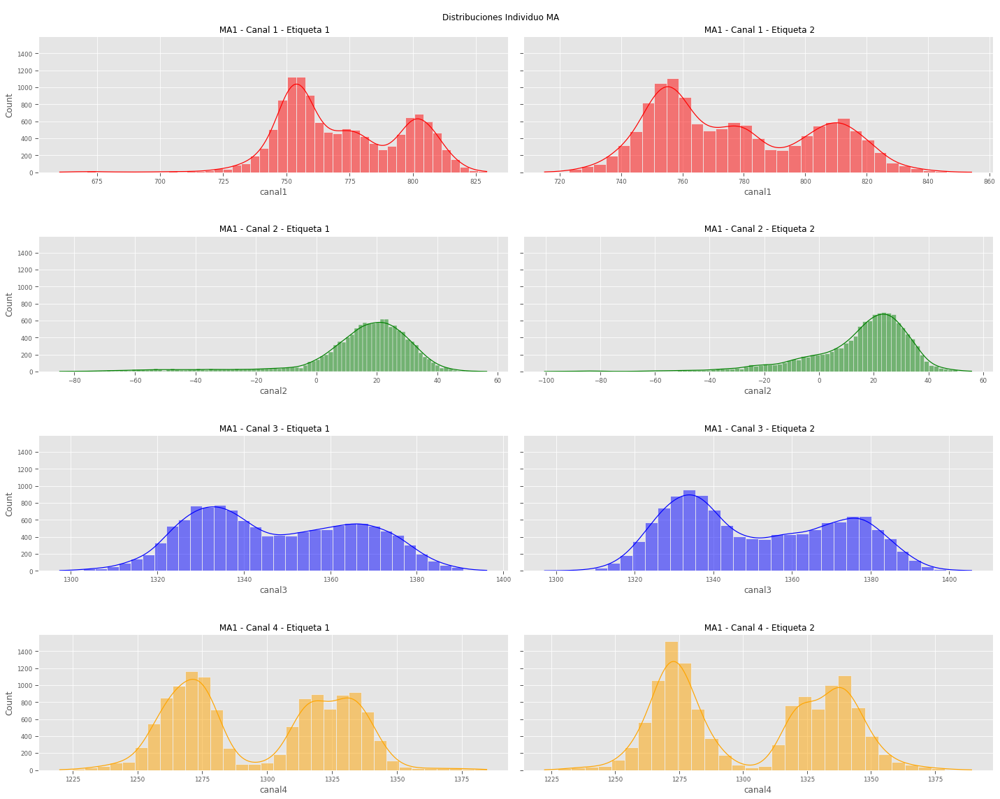

In [27]:
# MA - Canal 1 - Etiqueta 1 y Etiqueta 2
# Se grafica la distribución de los valores de voltaje
fig, axes = plt.subplots(4, 2, figsize=(20, 16), sharey=True)
fig.suptitle('Distribuciones Individuo MA')

canal = "canal1"
color_ch = color_ch1
sns.histplot(ax=axes[0, 0], x=df_MA1[df_MA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 0].set_title("\n\n MA1 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 1], x=df_MA1[df_MA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[0, 1].set_title("\n\n MA1 - Canal 1 - Etiqueta 2")

canal = "canal2"
color_ch = color_ch2
sns.histplot(ax=axes[1, 0], x=df_MA1[df_MA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[1, 0].set_title("\n\n MA1 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[1, 1], x=df_MA1[df_MA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 1].set_title("\n\n MA1 - Canal 2 - Etiqueta 2")

canal = "canal3"
color_ch = color_ch3
sns.histplot(ax=axes[2, 0], x=df_MA1[df_MA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 0].set_title("\n\n MA1 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[2, 1], x=df_MA1[df_MA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[2, 1].set_title("\n\n MA1 - Canal 3 - Etiqueta 2")

canal = "canal4"
color_ch = color_ch4
sns.histplot(ax=axes[3, 0], x=df_MA1[df_MA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[3, 0].set_title("\n\n MA1 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[3, 1], x=df_MA1[df_MA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 1].set_title("\n\n MA1 - Canal 4 - Etiqueta 2")

plt.tight_layout()

**Detrend by Model Fitting**

Una tendencia en una serie temporal puede visualizarse fácilmente como una línea que atraviesa las observaciones.

Éste enfoque puede ayudar a identificar si una tendencia está presente. Además de utilizarse como herramienta de identificación de tendencias, estos modelos de ajuste también pueden utilizarse para "desdiferenciar" una serie temporal, que es lo que haremos en éste caso. 
Por ejemplo, se puede ajustar un modelo lineal en el índice temporal para predecir la observación. Este conjunto de datos tendría el siguiente aspecto:

X, y

1, obs1

2, obs2

3, obs3

4, obs4

5, obs5

Las predicciones de este modelo formarán una línea recta que puede tomarse como la línea de tendencia del conjunto de datos. Estas predicciones también pueden restarse de la serie temporal original para obtener una versión sin tendencia del conjunto de datos.

value(t) = observation(t) - prediction(t)

Los residuos del ajuste del modelo son una forma de eliminación de tendencias del dataset. 

Hemos implementado ésto en Python entrenando un modelo "LinearRegression" de scikit-learn en los datos. Obteniendo un nuevo rango rango de valores para las señales en cada segmento.


In [28]:
def detrend_serie(s):

  # fit linear model
  X = [i for i in range(0, len(s))]
  X = numpy.reshape(X, (len(X), 1))
  #print("X: ", X)
  y = s.values
  #print("Y", y)
  model = LinearRegression()
  model.fit(X, y)

  # calculate trend
  trend = model.predict(X)
  # plot trend
  #sns.set(rc={'figure.figsize':(30,5)})
  #plt.plot(y)
  #plt.plot(trend)
  #plt.legend(['data', 'trend'])
  #plt.show()

  # detrend
  detrended = [y[i]-trend[i] for i in range(0, len(s))]

  return detrended


In [29]:
dfs_names = ['AA0', 'AA1', 'AA2', 'HA1', 'JA1', 'JA2', 'MA1']
dfs = [df_AA0, df_AA1, df_AA2, df_HA1, df_JA1, df_JA2, df_MA1]
i=0
for d in dfs:
  for c in ["canal1","canal2","canal3","canal4"]:
    detrended = detrend_serie(d[c])
    d[c+"_norm"] = detrended
  print(dfs_names[i]+ ":")
  display(d[:1])
  print("\n")
  i=i+1

AA0:


,num_muestra,canal1,canal2,canal3,canal4,etiqueta,marca_temporal,persona,sesion,canal1_norm,canal2_norm,canal3_norm,canal4_norm
8806,163,109.92,80.89,116.7,25.98,2,1900-01-01 14:03:34.808,AA,0,63.643612,51.922275,64.22385,56.333129




AA1:


,num_muestra,canal1,canal2,canal3,canal4,etiqueta,marca_temporal,persona,sesion,canal1_norm,canal2_norm,canal3_norm,canal4_norm
14989,49,1856.34,814.71,1963.03,1954.19,2,1900-01-01 12:08:58.762,AA,1,-134.133833,-113.034877,-142.258219,-11.231778




AA2:


,num_muestra,canal1,canal2,canal3,canal4,etiqueta,marca_temporal,persona,sesion,canal1_norm,canal2_norm,canal3_norm,canal4_norm
37348,163,1754.99,871.82,1899.43,1855.22,2,1900-01-01 14:34:47.426,AA,2,-12.682148,-15.49247,-10.095086,-12.487128




HA1:


,num_muestra,canal1,canal2,canal3,canal4,etiqueta,marca_temporal,persona,sesion,canal1_norm,canal2_norm,canal3_norm,canal4_norm
20176,65,1840.67,864.2,1789.17,1857.27,2,1900-01-01 16:37:43.591,HA,1,58.012548,92.930323,48.638138,63.612353




JA1:


,num_muestra,canal1,canal2,canal3,canal4,etiqueta,marca_temporal,persona,sesion,canal1_norm,canal2_norm,canal3_norm,canal4_norm
15628,151,2597.41,2652.14,2731.44,2663.33,1,1900-01-01 12:25:49.482,JA,1,-7.785667,-5.548297,-10.061296,-10.152837




JA2:


,num_muestra,canal1,canal2,canal3,canal4,etiqueta,marca_temporal,persona,sesion,canal1_norm,canal2_norm,canal3_norm,canal4_norm
11377,121,1761.12,1049.31,1931.93,1762.73,1,1900-01-01 12:50:17.586,JA,2,-78.502157,-75.741091,-56.31353,-117.656407




MA1:


,num_muestra,canal1,canal2,canal3,canal4,etiqueta,marca_temporal,persona,sesion,canal1_norm,canal2_norm,canal3_norm,canal4_norm
16237,157,744.04,29.12,1315.13,1254.01,1,1900-01-01 10:19:35.968,MA,1,6.436567,19.324983,-3.711532,4.373786


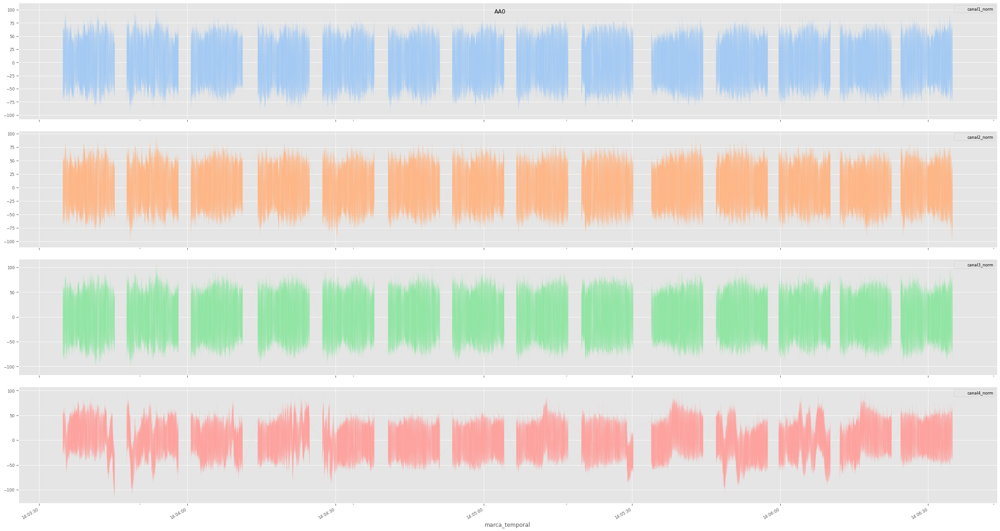

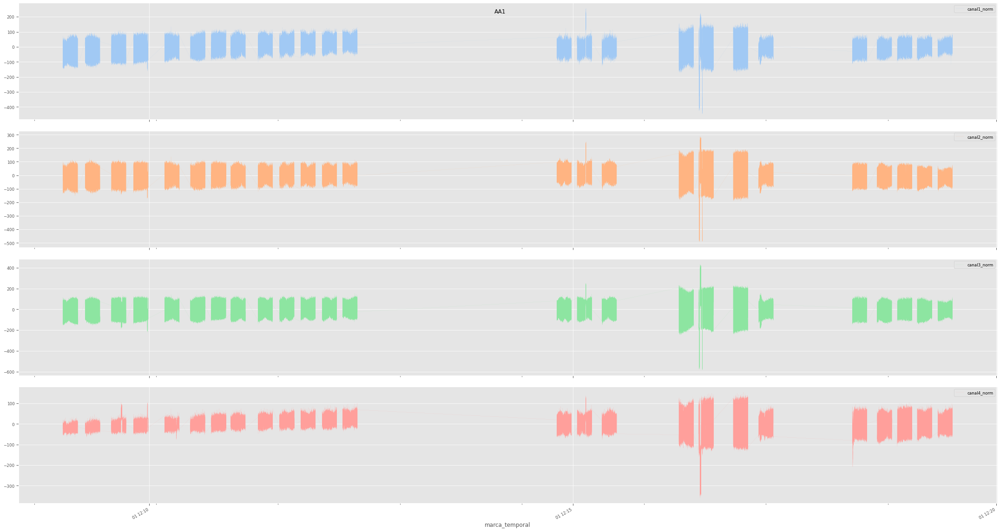

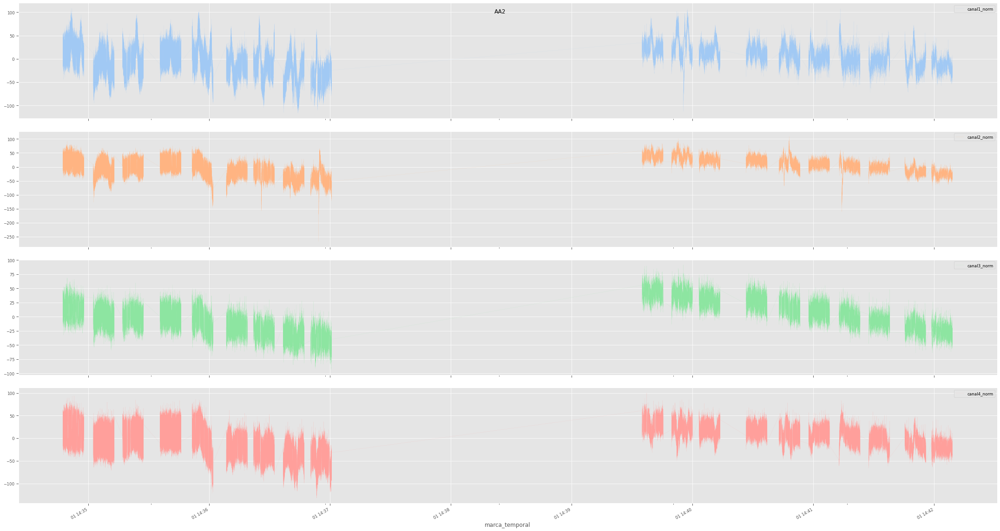

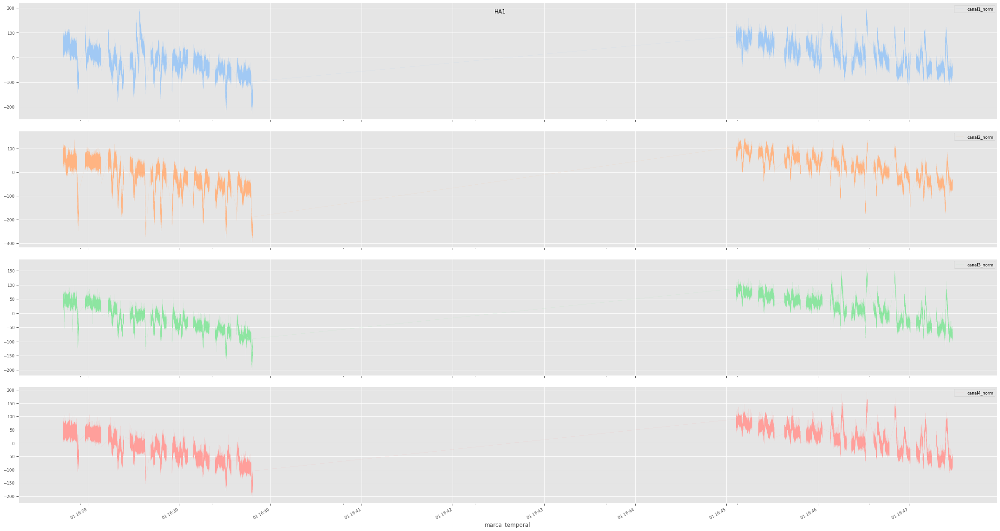

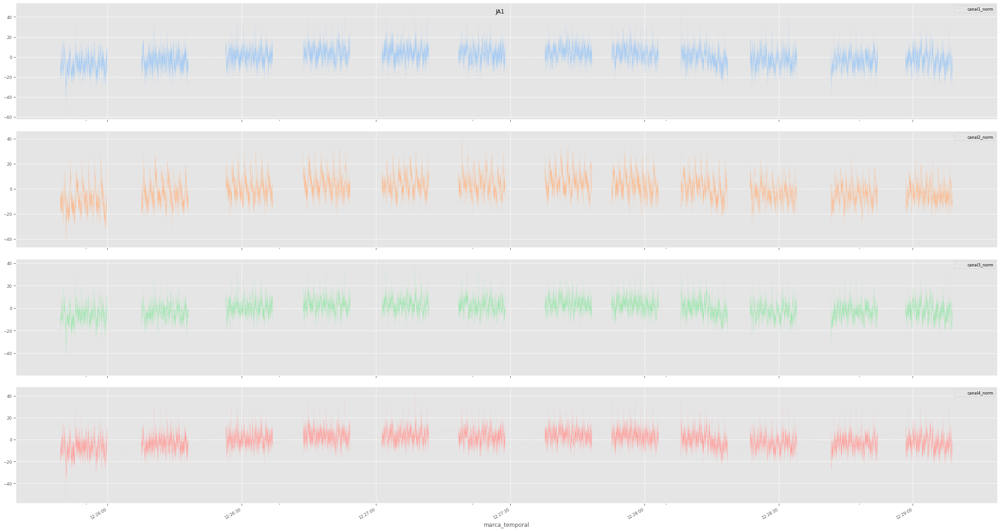

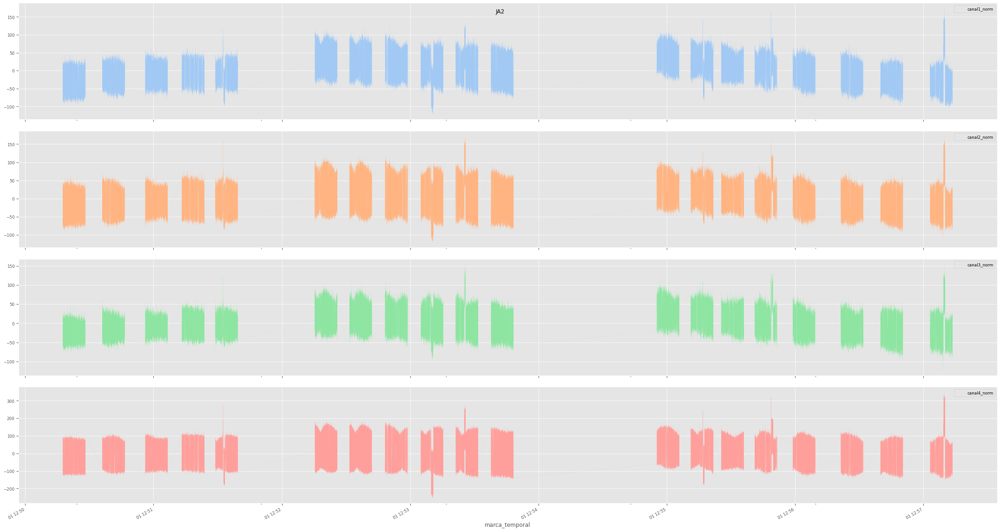

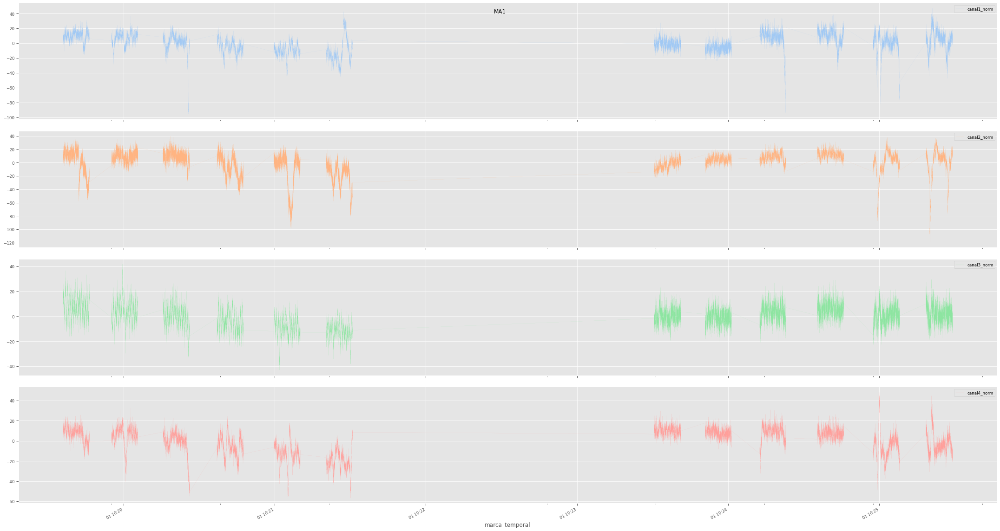

In [30]:
# Gráfica de los voltajes de cada canal en el tiempo por segmento (persona/sesión), después de aplicar la resta de la línea de tendencia
dfs_names = ['AA0', 'AA1', 'AA2', 'HA1', 'JA1', 'JA2', 'MA1']
dfs = [df_AA0, df_AA1, df_AA2, df_HA1, df_JA1, df_JA2, df_MA1]
i=0
for d in dfs:
  d.plot(figsize=(30,16), subplots=True, x="marca_temporal", y=["canal1_norm","canal2_norm","canal3_norm","canal4_norm"], style='-', linewidth=0.1, title=dfs_names[i])
  i=i+1
  plt.tight_layout(h_pad=2)

Vemos que luego de restar la línea de tendencia cambian los rangos de voltaje para cada canal, han disminuído. 

**Distribuciones después de restar las líneas de tendencia**

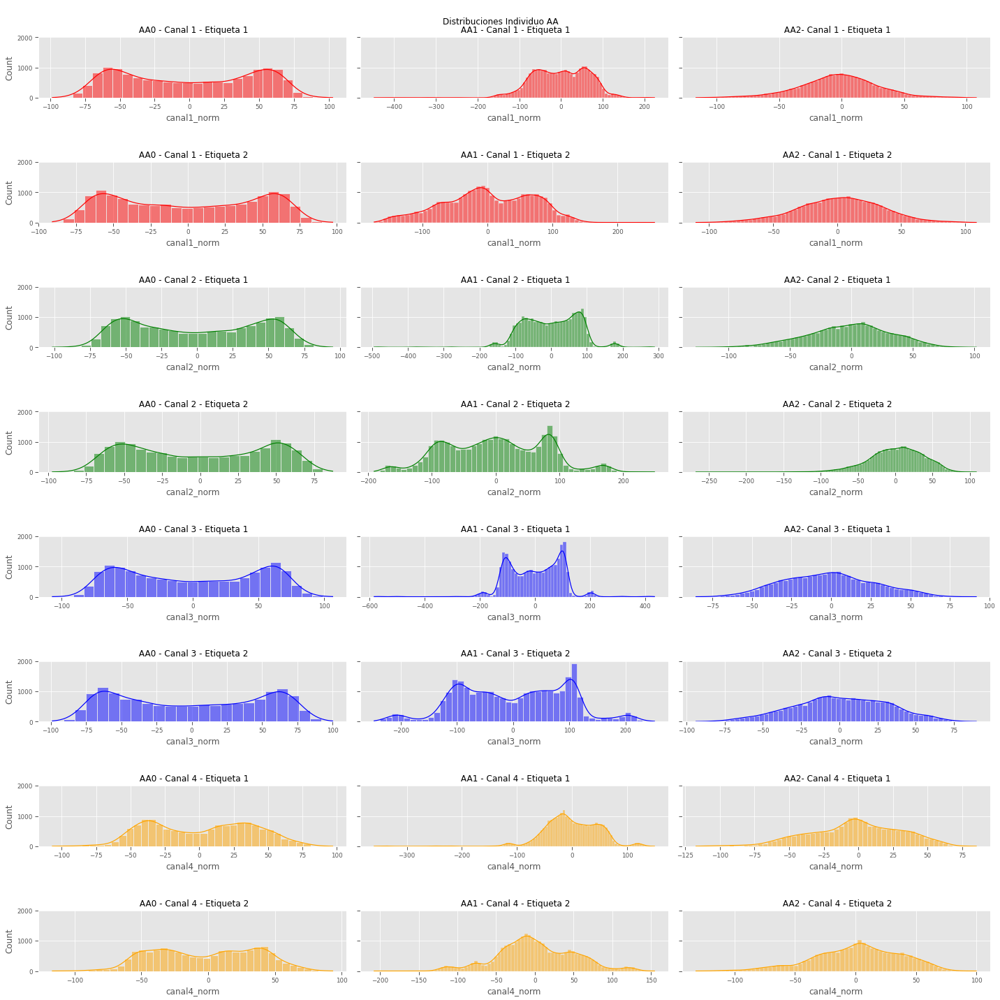

In [31]:
# AA - Canal 1 - Etiqueta 1 y Etiqueta 2
# Se grafica la distribución de los valores de voltaje
fig, axes = plt.subplots(8, 3, figsize=(20, 20), sharey=True)
fig.suptitle('Distribuciones Individuo AA')

canal = "canal1_norm"
color_ch = color_ch1
sns.histplot(ax=axes[0, 0], x=df_AA0[df_AA0['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 0].set_title("\n\n AA0 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 1], x=df_AA1[df_AA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 1].set_title("\n\n AA1 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 2], x=df_AA2[df_AA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 2].set_title("\n\n AA2- Canal 1 - Etiqueta 1")

sns.histplot(ax=axes[1, 0], x=df_AA0[df_AA0['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 0].set_title("\n\n AA0 - Canal 1 - Etiqueta 2")
sns.histplot(ax=axes[1, 1], x=df_AA1[df_AA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 1].set_title("\n\n AA1 - Canal 1 - Etiqueta 2")
sns.histplot(ax=axes[1, 2], x=df_AA2[df_AA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 2].set_title("\n\n AA2 - Canal 1 - Etiqueta 2")

canal = "canal2_norm"
color_ch = color_ch2
sns.histplot(ax=axes[2, 0], x=df_AA0[df_AA0['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 0].set_title("\n\n AA0 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[2, 1], x=df_AA1[df_AA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 1].set_title("\n\n AA1 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[2, 2], x=df_AA2[df_AA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 2].set_title("\n\n AA2- Canal 2 - Etiqueta 1")

sns.histplot(ax=axes[3, 0], x=df_AA0[df_AA0['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 0].set_title("\n\n AA0 - Canal 2 - Etiqueta 2")
sns.histplot(ax=axes[3, 1], x=df_AA1[df_AA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 1].set_title("\n\n AA1 - Canal 2 - Etiqueta 2")
sns.histplot(ax=axes[3, 2], x=df_AA2[df_AA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 2].set_title("\n\n AA2 - Canal 2 - Etiqueta 2")

canal = "canal3_norm"
color_ch = color_ch3
sns.histplot(ax=axes[4, 0], x=df_AA0[df_AA0['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 0].set_title("\n\n AA0 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[4, 1], x=df_AA1[df_AA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 1].set_title("\n\n AA1 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[4, 2], x=df_AA2[df_AA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 2].set_title("\n\n AA2- Canal 3 - Etiqueta 1")

sns.histplot(ax=axes[5, 0], x=df_AA0[df_AA0['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 0].set_title("\n\n AA0 - Canal 3 - Etiqueta 2")
sns.histplot(ax=axes[5, 1], x=df_AA1[df_AA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 1].set_title("\n\n AA1 - Canal 3 - Etiqueta 2")
sns.histplot(ax=axes[5, 2], x=df_AA2[df_AA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 2].set_title("\n\n AA2 - Canal 3 - Etiqueta 2")

canal = "canal4_norm"
color_ch = color_ch4
sns.histplot(ax=axes[6, 0], x=df_AA0[df_AA0['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 0].set_title("\n\n AA0 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[6, 1], x=df_AA1[df_AA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 1].set_title("\n\n AA1 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[6, 2], x=df_AA2[df_AA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 2].set_title("\n\n AA2- Canal 4 - Etiqueta 1")

sns.histplot(ax=axes[7, 0], x=df_AA0[df_AA0['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 0].set_title("\n\n AA0 - Canal 4 - Etiqueta 2")
sns.histplot(ax=axes[7, 1], x=df_AA1[df_AA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 1].set_title("\n\n AA1 - Canal 4 - Etiqueta 2")
sns.histplot(ax=axes[7, 2], x=df_AA2[df_AA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 2].set_title("\n\n AA2 - Canal 4 - Etiqueta 2")

plt.tight_layout()

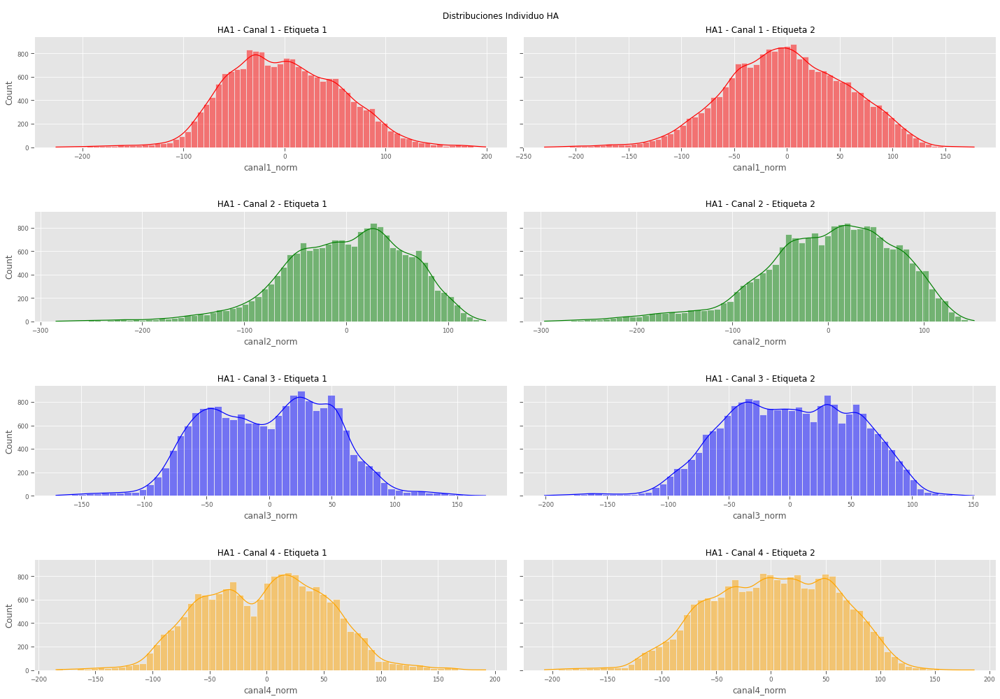

In [32]:
# HA - Canal 1 - Etiqueta 1 y Etiqueta 2
# Se grafica la distribución de los valores de voltaje
fig, axes = plt.subplots(4, 2, figsize=(20, 14), sharey=True)
fig.suptitle('Distribuciones Individuo HA')

canal = "canal1_norm"
color_ch = color_ch1
sns.histplot(ax=axes[0, 0], x=df_HA1[df_HA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 0].set_title("\n\n HA1 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 1], x=df_HA1[df_HA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[0, 1].set_title("\n\n HA1 - Canal 1 - Etiqueta 2")

canal = "canal2_norm"
color_ch = color_ch2
sns.histplot(ax=axes[1, 0], x=df_HA1[df_HA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[1, 0].set_title("\n\n HA1 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[1, 1], x=df_HA1[df_HA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 1].set_title("\n\n HA1 - Canal 2 - Etiqueta 2")

canal = "canal3_norm"
color_ch = color_ch3
sns.histplot(ax=axes[2, 0], x=df_HA1[df_HA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 0].set_title("\n\n HA1 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[2, 1], x=df_HA1[df_HA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[2, 1].set_title("\n\n HA1 - Canal 3 - Etiqueta 2")

canal = "canal4_norm"
color_ch = color_ch4
sns.histplot(ax=axes[3, 0], x=df_HA1[df_HA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[3, 0].set_title("\n\n HA1 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[3, 1], x=df_HA1[df_HA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 1].set_title("\n\n HA1 - Canal 4 - Etiqueta 2")

plt.tight_layout()

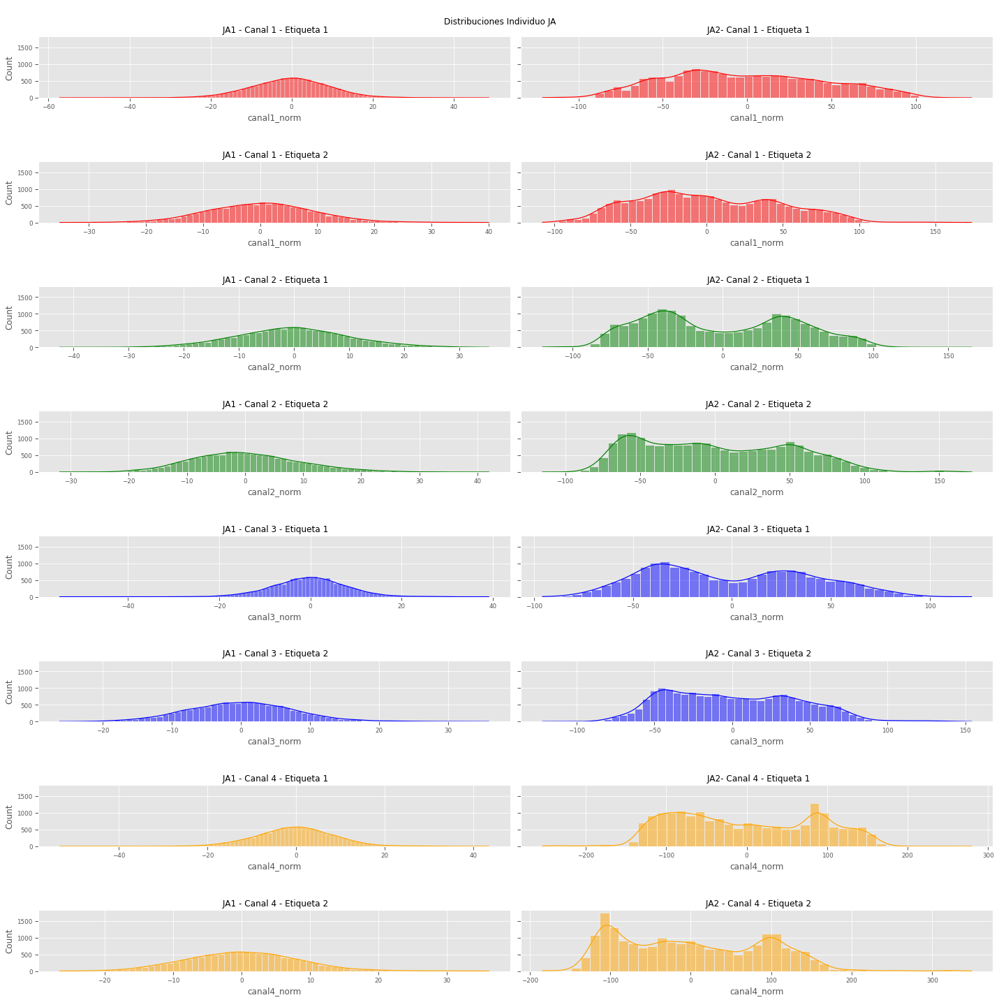

In [33]:
# JA - Canal 1 - Etiqueta 1 y Etiqueta 2
# Se grafica la distribución de los valores de voltaje
fig, axes = plt.subplots(8, 2, figsize=(20, 20), sharey=True)
fig.suptitle('Distribuciones Individuo JA')

canal = "canal1_norm"
color_ch = color_ch1
sns.histplot(ax=axes[0, 0], x=df_JA1[df_JA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 0].set_title("\n\n JA1 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 1], x=df_JA2[df_JA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 1].set_title("\n\n JA2- Canal 1 - Etiqueta 1")

sns.histplot(ax=axes[1, 0], x=df_JA1[df_JA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 0].set_title("\n\n JA1 - Canal 1 - Etiqueta 2")
sns.histplot(ax=axes[1, 1], x=df_JA2[df_JA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 1].set_title("\n\n JA2 - Canal 1 - Etiqueta 2")

canal = "canal2_norm"
color_ch = color_ch2
sns.histplot(ax=axes[2, 0], x=df_JA1[df_JA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 0].set_title("\n\n JA1 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[2, 1], x=df_JA2[df_JA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 1].set_title("\n\n JA2- Canal 2 - Etiqueta 1")

sns.histplot(ax=axes[3, 0], x=df_JA1[df_JA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 0].set_title("\n\n JA1 - Canal 2 - Etiqueta 2")
sns.histplot(ax=axes[3, 1], x=df_JA2[df_JA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 1].set_title("\n\n JA2 - Canal 2 - Etiqueta 2")

canal = "canal3_norm"
color_ch = color_ch3
sns.histplot(ax=axes[4, 0], x=df_JA1[df_JA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 0].set_title("\n\n JA1 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[4, 1], x=df_JA2[df_JA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[4, 1].set_title("\n\n JA2- Canal 3 - Etiqueta 1")

sns.histplot(ax=axes[5, 0], x=df_JA1[df_JA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 0].set_title("\n\n JA1 - Canal 3 - Etiqueta 2")
sns.histplot(ax=axes[5, 1], x=df_JA2[df_JA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[5, 1].set_title("\n\n JA2 - Canal 3 - Etiqueta 2")

canal = "canal4_norm"
color_ch = color_ch4
sns.histplot(ax=axes[6, 0], x=df_JA1[df_JA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 0].set_title("\n\n JA1 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[6, 1], x=df_JA2[df_JA2['etiqueta']==1][canal],kde=True, color=color_ch)
axes[6, 1].set_title("\n\n JA2- Canal 4 - Etiqueta 1")

sns.histplot(ax=axes[7, 0], x=df_JA1[df_JA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 0].set_title("\n\n JA1 - Canal 4 - Etiqueta 2")
sns.histplot(ax=axes[7, 1], x=df_JA2[df_JA2['etiqueta']==2][canal],kde=True, color=color_ch)
axes[7, 1].set_title("\n\n JA2 - Canal 4 - Etiqueta 2")

plt.tight_layout()

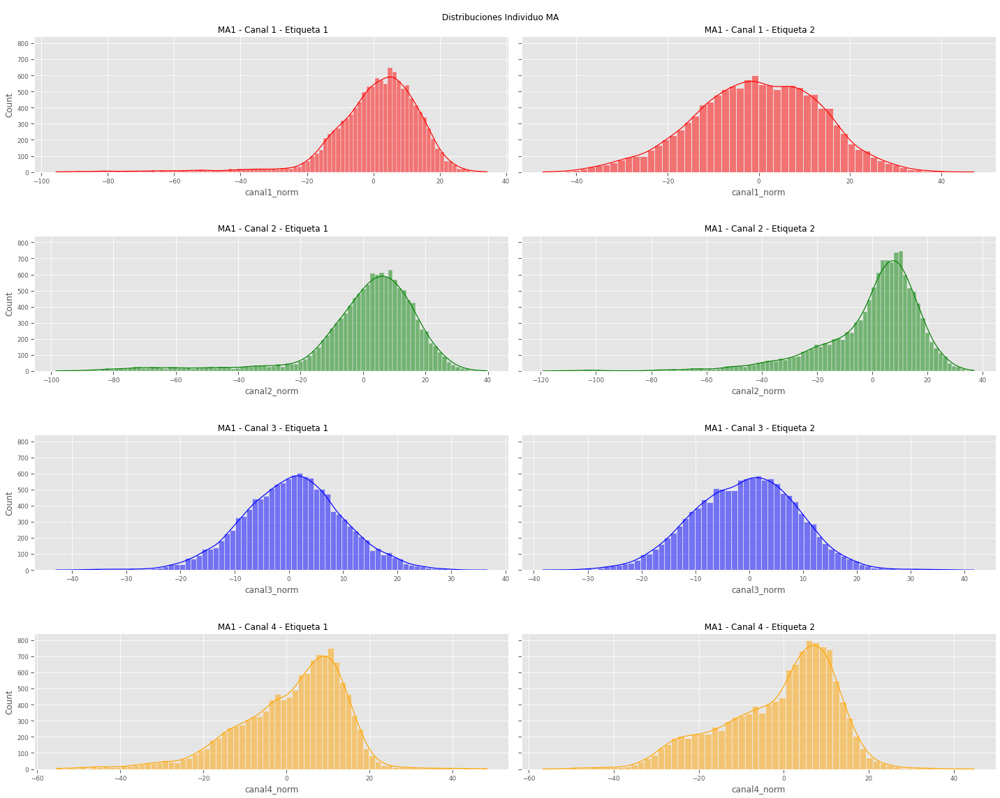

In [34]:
# MA - Canal 1 - Etiqueta 1 y Etiqueta 2
# Se grafica la distribución de los valores de voltaje
fig, axes = plt.subplots(4, 2, figsize=(20, 16), sharey=True)
fig.suptitle('Distribuciones Individuo MA')

canal = "canal1_norm"
color_ch = color_ch1
sns.histplot(ax=axes[0, 0], x=df_MA1[df_MA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[0, 0].set_title("\n\n MA1 - Canal 1 - Etiqueta 1")
sns.histplot(ax=axes[0, 1], x=df_MA1[df_MA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[0, 1].set_title("\n\n MA1 - Canal 1 - Etiqueta 2")

canal = "canal2_norm"
color_ch = color_ch2
sns.histplot(ax=axes[1, 0], x=df_MA1[df_MA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[1, 0].set_title("\n\n MA1 - Canal 2 - Etiqueta 1")
sns.histplot(ax=axes[1, 1], x=df_MA1[df_MA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[1, 1].set_title("\n\n MA1 - Canal 2 - Etiqueta 2")

canal = "canal3_norm"
color_ch = color_ch3
sns.histplot(ax=axes[2, 0], x=df_MA1[df_MA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[2, 0].set_title("\n\n MA1 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[2, 1], x=df_MA1[df_MA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[2, 1].set_title("\n\n MA1 - Canal 3 - Etiqueta 2")

canal = "canal4_norm"
color_ch = color_ch4
sns.histplot(ax=axes[3, 0], x=df_MA1[df_MA1['etiqueta']==1][canal],kde=True, color=color_ch)
axes[3, 0].set_title("\n\n MA1 - Canal 4 - Etiqueta 1")
sns.histplot(ax=axes[3, 1], x=df_MA1[df_MA1['etiqueta']==2][canal],kde=True, color=color_ch)
axes[3, 1].set_title("\n\n MA1 - Canal 4 - Etiqueta 2")

plt.tight_layout()

Vemos que luego de la resta de las lineas de tendencia, las distribuciones ya no se aprecian con dos polaridades con distribuciones casi normales (en cada polaridad -para valores negativos, y positivos de voltaje-). Ahora se han vuelto algunas de aparencia normal y otras parecieran tener distribución uniforme.

**Ouliers luego de restar las líneas de tendencia**

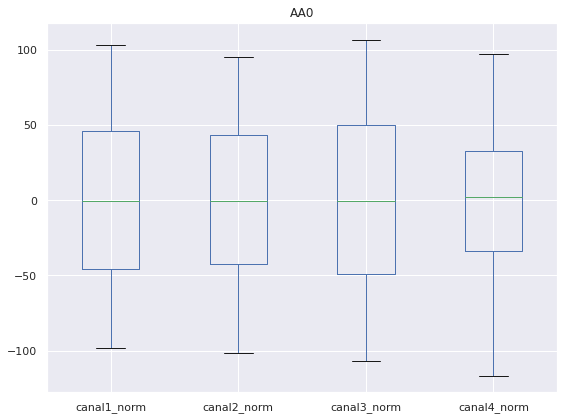

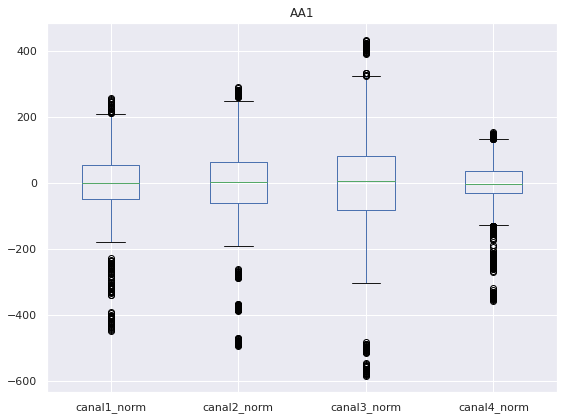

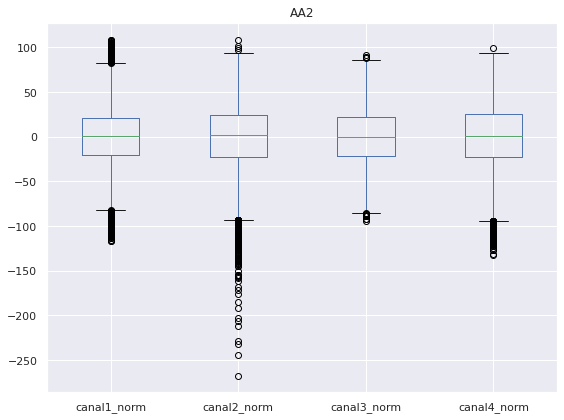

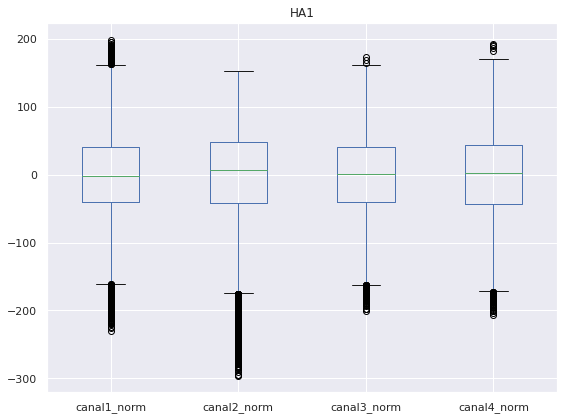

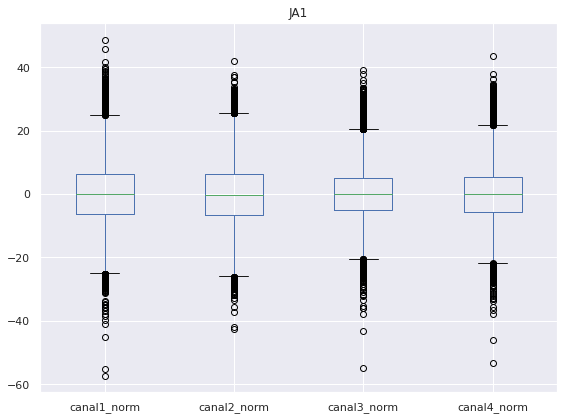

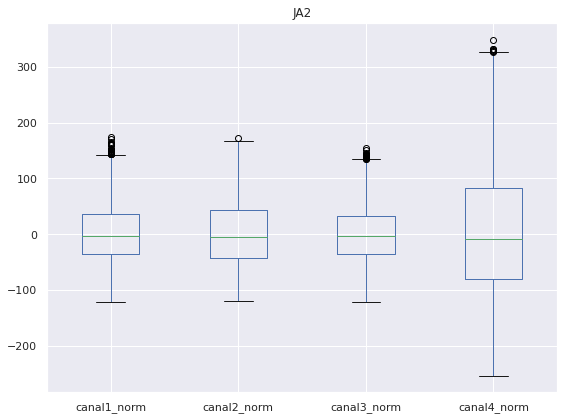

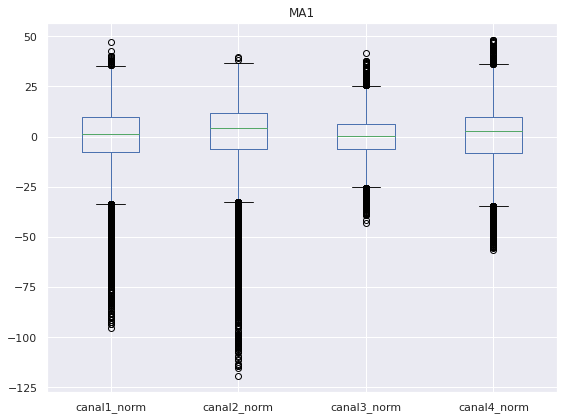

In [35]:
# boxplots para ver outliers
dfs_names = ['AA0', 'AA1', 'AA2', 'HA1', 'JA1', 'JA2', 'MA1']
dfs = [df_AA0, df_AA1, df_AA2, df_HA1, df_JA1, df_JA2, df_MA1]
i=0
for d in dfs:
  sns.set(rc={'figure.figsize':(8,6)})
  d[["marca_temporal","canal1_norm","canal2_norm","canal3_norm","canal4_norm"]].plot.box(title=dfs_names[i]) #alpha=0.2
  plt.tight_layout(h_pad=2)
  i=i+1

Si bien los rangos de valores de voltajes para cada canal se redujeron (se tiene como mín: -600 y como máx: 400). Se visualiza aún en los bolxplots la existencia de gran cantidad de valores outliers. Utilizaremos el método de rango intercuartílico para eliminarlos.

In [36]:
def remove_outlier(df_in, col_name, iqr_factor = 1.5):
    """
    IQR outliers removal 
    (https://machinelearningmastery.com/how-to-use-statistics-to-identify-outliers-in-data/)
    accept a dataframe, remove outliers, return cleaned data in a new dataframe
    see http://www.itl.nist.gov/div898/handbook/prc/section1/prc16.htm
    """
    q1 = df_in[col_name].quantile(0.25)
    q3 = df_in[col_name].quantile(0.75)
    iqr = q3 - q1 # interquartile range
    fence_low  = q1 - iqr_factor*iqr
    fence_high = q3 + iqr_factor*iqr
    df_inliers = df_in.loc[(df_in[col_name] > fence_low) & (df_in[col_name] < fence_high)]
    return df_inliers

In [37]:
f= 1.5
df_AA0 = remove_outlier(df_AA0, 'canal1_norm', iqr_factor = f)
df_AA0 = remove_outlier(df_AA0, 'canal2_norm', iqr_factor = f)
df_AA0 = remove_outlier(df_AA0, 'canal3_norm', iqr_factor = f)
df_AA0 = remove_outlier(df_AA0, 'canal4_norm', iqr_factor = f)
df_AA0.reset_index(drop=True)

df_AA1 = remove_outlier(df_AA1, 'canal1_norm', iqr_factor = f)
df_AA1 = remove_outlier(df_AA1, 'canal2_norm', iqr_factor = f)
df_AA1 = remove_outlier(df_AA1, 'canal3_norm', iqr_factor = f)
df_AA1 = remove_outlier(df_AA1, 'canal4_norm', iqr_factor = f)
df_AA1.reset_index(drop=True)

df_AA2 = remove_outlier(df_AA2, 'canal1_norm', iqr_factor = f)
df_AA2 = remove_outlier(df_AA2, 'canal2_norm', iqr_factor = f)
df_AA2 = remove_outlier(df_AA2, 'canal3_norm', iqr_factor = f)
df_AA2 = remove_outlier(df_AA2, 'canal4_norm', iqr_factor = f)
df_AA2.reset_index(drop=True)

df_HA1 = remove_outlier(df_HA1, 'canal1_norm', iqr_factor = f)
df_HA1 = remove_outlier(df_HA1, 'canal2_norm', iqr_factor = f)
df_HA1 = remove_outlier(df_HA1, 'canal3_norm', iqr_factor = f)
df_HA1 = remove_outlier(df_HA1, 'canal4_norm', iqr_factor = f)
df_HA1.reset_index(drop=True)

df_JA1 = remove_outlier(df_JA1, 'canal1_norm', iqr_factor = f)
df_JA1 = remove_outlier(df_JA1, 'canal2_norm', iqr_factor = f)
df_JA1 = remove_outlier(df_JA1, 'canal3_norm', iqr_factor = f)
df_JA1 = remove_outlier(df_JA1, 'canal4_norm', iqr_factor = f)
df_JA1.reset_index(drop=True)

df_JA2 = remove_outlier(df_JA2, 'canal1_norm', iqr_factor = f)
df_JA2 = remove_outlier(df_JA2, 'canal2_norm', iqr_factor = f)
df_JA2 = remove_outlier(df_JA2, 'canal3_norm', iqr_factor = f)
df_JA2 = remove_outlier(df_JA2, 'canal4_norm', iqr_factor = f)
df_JA2.reset_index(drop=True)

df_MA1 = remove_outlier(df_MA1, 'canal1_norm', iqr_factor = f)
df_MA1 = remove_outlier(df_MA1, 'canal2_norm', iqr_factor = f)
df_MA1 = remove_outlier(df_MA1, 'canal3_norm', iqr_factor = f)
df_MA1 = remove_outlier(df_MA1, 'canal4_norm', iqr_factor = f)
df_MA1.reset_index(drop=True)

,num_muestra,canal1,canal2,canal3,canal4,etiqueta,marca_temporal,persona,sesion,canal1_norm,canal2_norm,canal3_norm,canal4_norm
0,157,744.04,29.12,1315.13,1254.01,1,1900-01-01 10:19:35.968,MA,1,6.436567,19.324983,-3.711532,4.373786
1,158,740.54,21.14,1311.62,1251.96,1,1900-01-01 10:19:35.968,MA,1,2.933635,11.344600,-7.223959,2.319756
2,159,742.99,9.76,1308.97,1253.18,1,1900-01-01 10:19:35.969,MA,1,5.380703,-0.035783,-9.876386,3.535727
3,160,749.62,23.67,1314.97,1255.45,1,1900-01-01 10:19:35.969,MA,1,12.007772,13.873834,-3.878813,5.801698
4,161,742.87,27.64,1311.37,1254.95,1,1900-01-01 10:19:35.983,MA,1,5.254840,17.843450,-7.481240,5.297669
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22777,42,815.69,35.28,1375.77,1342.87,2,1900-01-01 10:25:29.022,MA,1,4.054752,15.805285,-4.361261,-8.513484
22778,43,820.15,27.68,1383.28,1343.82,2,1900-01-01 10:25:29.037,MA,1,8.511820,8.204902,3.146312,-7.567513
22779,44,817.14,38.31,1376.00,1339.48,2,1900-01-01 10:25:29.037,MA,1,5.498888,18.834518,-4.136115,-11.911542
22780,45,810.50,43.12,1366.69,1333.69,2,1900-01-01 10:25:29.037,MA,1,-1.144043,23.644135,-13.448543,-17.705571


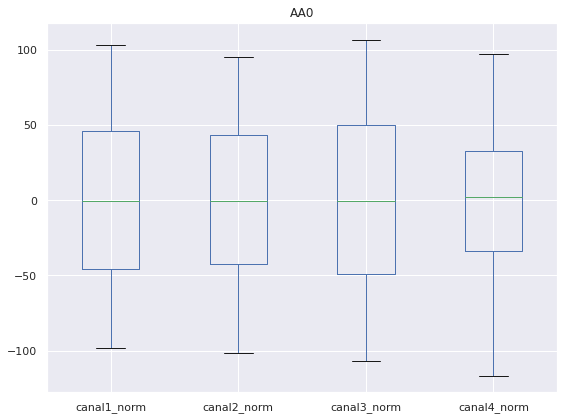

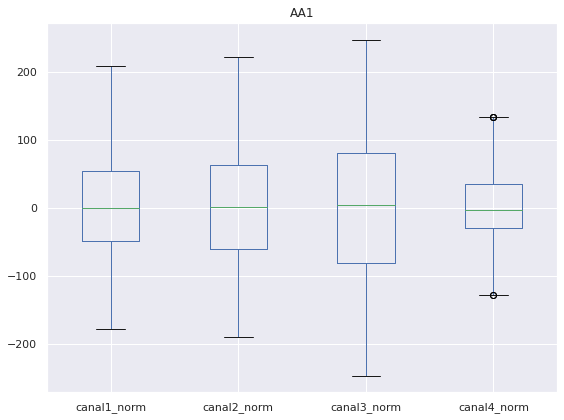

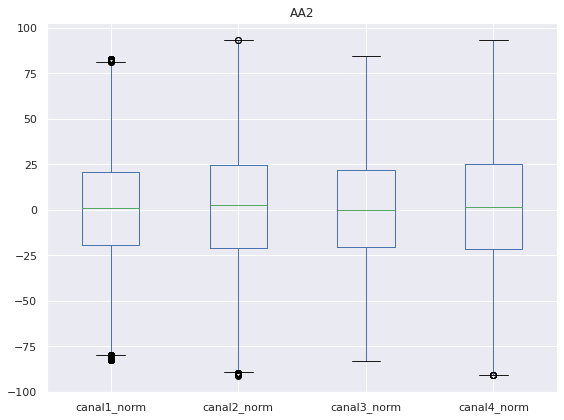

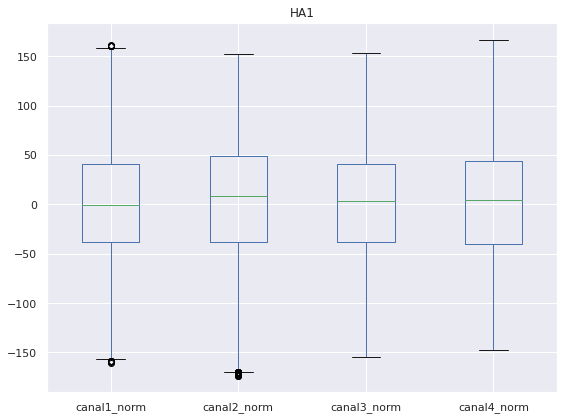

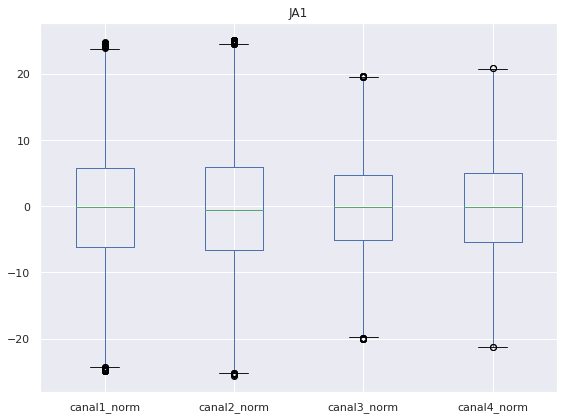

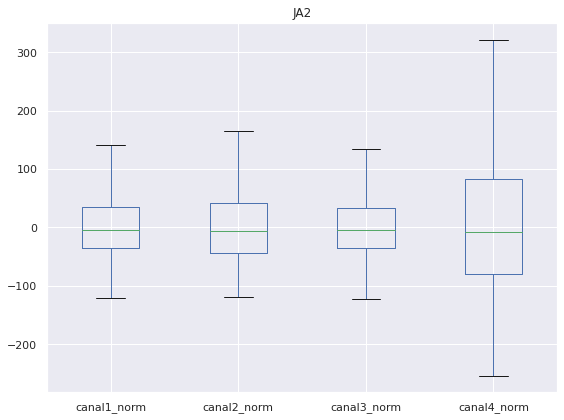

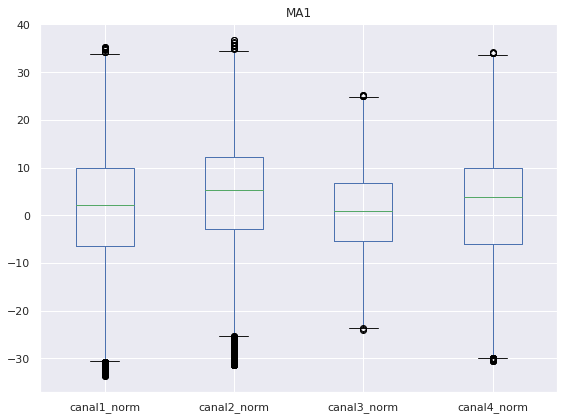

In [38]:
# Veamos si siguen apareciendo outliers
# boxplots para ver outliers
dfs_names = ['AA0', 'AA1', 'AA2', 'HA1', 'JA1', 'JA2', 'MA1']
dfs = [df_AA0, df_AA1, df_AA2, df_HA1, df_JA1, df_JA2, df_MA1]
i=0
for d in dfs:
  sns.set(rc={'figure.figsize':(8,6)})
  d[["marca_temporal","canal1_norm","canal2_norm","canal3_norm","canal4_norm"]].plot.box(title=dfs_names[i])
  plt.tight_layout(h_pad=2)
  i=i+1

In [39]:
# Show shapes for each df, after delete outliers from chanel values
dfs = [df_AA0, df_AA1, df_AA2, df_HA1, df_JA1, df_JA2, df_MA1]
i=0
for d in dfs:
  print(dfs_names[i] + ": ", len(d))
  i=i+1

AA0:  29448
AA1:  52225
AA2:  38967
HA1:  39107
JA1:  24456
JA2:  39881
MA1:  22782


Se verifican que los rangos de voltajes disminuyeron al eliminar outliers (-200 a 300), lo cual resulta razonable para estudios de EEG.

**Observaciones**

- En nuestro dataset no se encontraron valores nulos en las variables pertinentes. 

  En caso de haber casos nulos en las variables de los canales la estrategia más pertinente sería rellenarlos con la interpolación entre el valor anterior y el subsiguiente.

  Para el caso de un valor nulo en la etiqueta se podría ver cuál es la etiqueta de la muestra posterior y anterior, si ambas coinciden agregar ese valor y si no coinciden agregaría un 99.

- Haciendo un análisis de los datos y con conocimiento de dominio evaluamos la posibilidad de que los datos tuvieran "artefactos/ruido" que hacen que estuvieran fuera de los rangos esperados en su mayoría, ya que las señales electroencefalográficas rondan los 200 micro Voltios.
Por ende valores de 2800 son valores que en principio nos llamó la atención pensando qué podía ser ruido. Como se observa en los boxplots, todo el dataset contiene valores muy por encima de los normales. Por ende se decidió restarle la línea de tendencia de cada canal en particular de cada individuo y sesión, para lograr un análisis más correcto.

[Consulta - Yani] ¿No es conveniente hacer un tratamiento distinto para cada señal(sesión)? Ya que se observa en los plots desviaciones diferentes de voltajes para cada sesión y para periodos dentro de una misma sesión.


**Suponiendo que los datos se adquieren a una frecuencia de muestreo exacta
  200Hz, ¿cómo se manifiesta esta información en el número de muestras
  presentes en el registro?**

Se va a tener 200 muestras por segundo, por ende si fueron estimulados durante 10 segundos seguidos se debe tener 2000 muestras con la misma etiqueta por cada estimulación. Es decir que con la frecuencia de muestreo y la cantidad de muestras se puede determinar cuánto tiempo el individuo fue estimulado con las luces y cuanto tiempo no se registró actividad.

[Consulta - Yani] ¿Hace falta codificar algo para peste punto?

**Determine la forma más adecuada de parsear los datos temporales para
  poder graficar las señales en el dominio del tiempo.**

Los datos temporales de la columnma 'marca_temporal' fueron convertidos a datetime, y ésta información es suficiente para graficar las señales en el dominio del tiempo. Se decide no realizar transformación en éste campo, ya que siempre es creciente y se trabajó con cada dataset por separado.

#### D) Generar visualizaciones de ejemplo para las series temporales provistas. Determinar los intervalos de tiempo más adecuados para generar visualizaciones claras que permitan comparar las señales en los siguientes escenarios:
- Un sujeto - todos los canales
- Un mismo canal - todos los sujetos
- Un mismo canal - mismo sujeto en diferentes sesiones
- Un mismo sujeto y canal - diferentes estados
- Mismo estado - diferentes sujetos

Al analizar estas visualizaciones, ¿extrae alguna información que considere
relevante para el problema? ¿Se observa algún fenómeno distinguible a primera vista?

### **Un sujeto - todos los canales**

Se elije el sujeto "AA" y la sesión '0'.

In [40]:
color_ch1 = 'red'
color_ch2 = 'green'
color_ch3 = 'blue'
color_ch4 = 'orange'

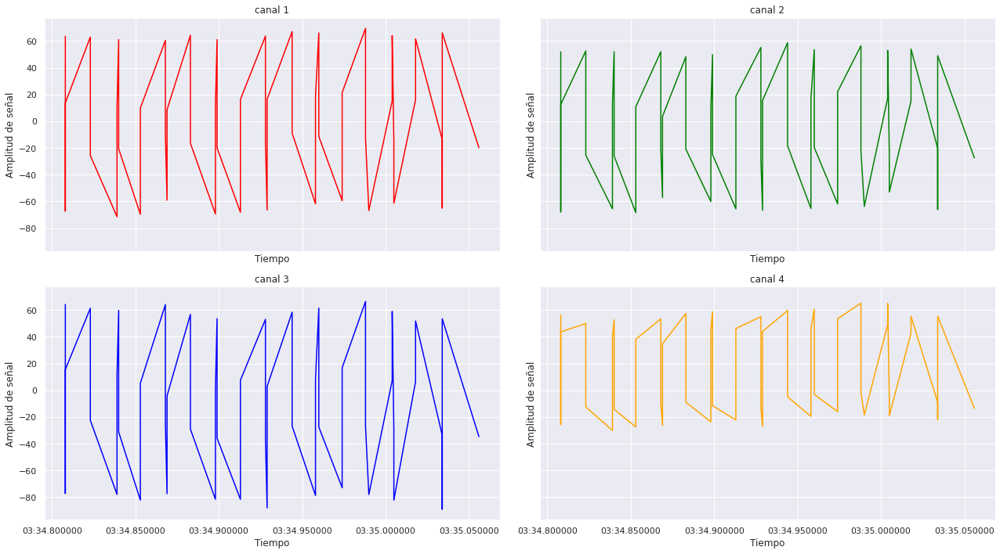

In [41]:
fig, axs = plt.subplots(2, 2,figsize=(18, 10),sharex=True,sharey=True)
num_muestras = 50
axs[0, 0].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal1_norm"].iloc[0:num_muestras],  color=color_ch1)
axs[0, 0].set_title('canal 1')

axs[0, 1].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal2_norm"].iloc[0:num_muestras],  color=color_ch2)
axs[0, 1].set_title('canal 2')

axs[1, 0].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal3_norm"].iloc[0:num_muestras], color=color_ch3)
axs[1, 0].set_title('canal 3')

axs[1, 1].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal4_norm"].iloc[0:num_muestras], color=color_ch4)
axs[1, 1].set_title('canal 4')

for ax in axs.flat:
    ax.set(xlabel='Tiempo', ylabel='Amplitud de señal')

plt.tight_layout()

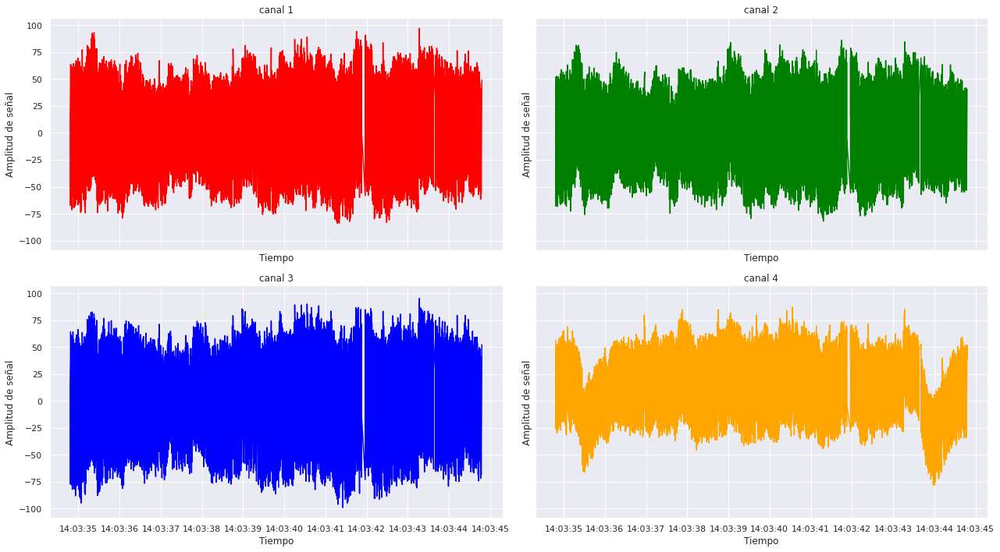

In [42]:
fig, axs = plt.subplots(2, 2,figsize=(18, 10),sharex=True,sharey=True)
num_muestras = 2000
axs[0, 0].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal1_norm"].iloc[0:num_muestras],  color=color_ch1)
axs[0, 0].set_title('canal 1')

axs[0, 1].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal2_norm"].iloc[0:num_muestras],  color=color_ch2)
axs[0, 1].set_title('canal 2')

axs[1, 0].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal3_norm"].iloc[0:num_muestras], color=color_ch3)
axs[1, 0].set_title('canal 3')

axs[1, 1].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal4_norm"].iloc[0:num_muestras], color=color_ch4)
axs[1, 1].set_title('canal 4')

for ax in axs.flat:
    ax.set(xlabel='Tiempo', ylabel='Amplitud de señal')

plt.tight_layout()

### **Un mismo canal - todos los sujetos**

Se elige el canal 1 para graficar.

In [43]:
df_JA1.head()

,num_muestra,canal1,canal2,canal3,canal4,etiqueta,marca_temporal,persona,sesion,canal1_norm,canal2_norm,canal3_norm,canal4_norm
15628,151,2597.41,2652.14,2731.44,2663.33,1,1900-01-01 12:25:49.482,JA,1,-7.785667,-5.548297,-10.061296,-10.152837
15629,152,2590.15,2649.72,2726.70,2653.98,1,1900-01-01 12:25:49.482,JA,1,-15.048891,-7.971879,-14.803993,-19.505525
15630,153,2589.47,2644.64,2726.83,2656.38,1,1900-01-01 12:25:49.483,JA,1,-15.732115,-13.055461,-14.676690,-17.108213
15631,154,2602.69,2645.06,2730.54,2662.67,1,1900-01-01 12:25:49.483,JA,1,-2.515340,-12.639043,-10.969387,-10.820901
15632,155,2595.93,2653.53,2734.98,2666.17,1,1900-01-01 12:25:49.497,JA,1,-9.278564,-4.172626,-6.532083,-7.323589


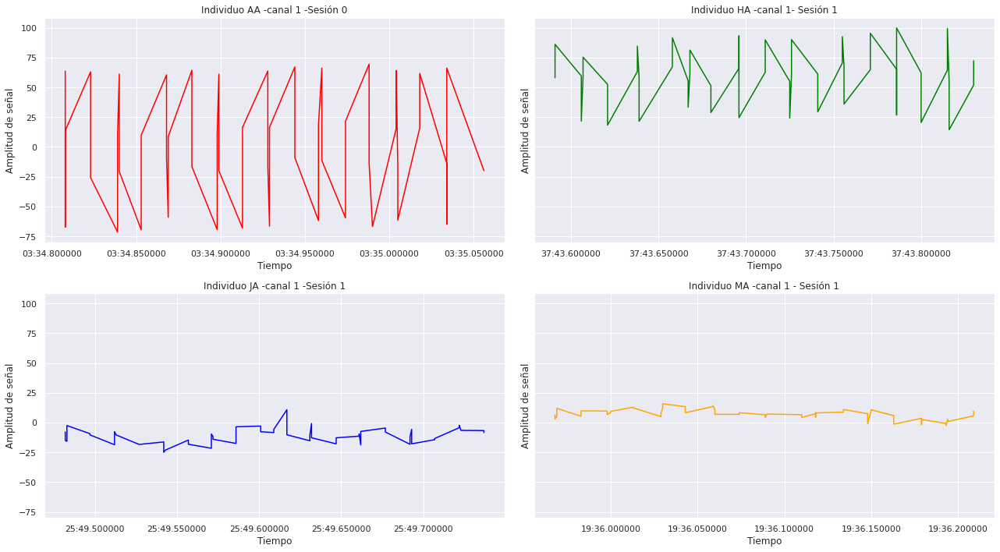

In [44]:
fig, axs = plt.subplots(2, 2,figsize=(18, 10),sharex=False,sharey=True)
num_muestras = 50
axs[0, 0].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal1_norm"].iloc[0:num_muestras],  color=color_ch1)
axs[0, 0].set_title('Individuo AA -canal 1 -Sesión 0')

axs[0, 1].plot( df_HA1["marca_temporal"].iloc[0:num_muestras],df_HA1["canal1_norm"].iloc[0:num_muestras],  color=color_ch2)
axs[0, 1].set_title('Individuo HA -canal 1- Sesión 1')

axs[1, 0].plot( df_JA1["marca_temporal"].iloc[0:num_muestras],df_JA1["canal1_norm"].iloc[0:num_muestras], color=color_ch3)
axs[1, 0].set_title('Individuo JA -canal 1 -Sesión 1')

axs[1, 1].plot( df_MA1["marca_temporal"].iloc[0:num_muestras],df_MA1["canal1_norm"].iloc[0:num_muestras], color=color_ch4)
axs[1, 1].set_title('Individuo MA -canal 1 - Sesión 1')

for ax in axs.flat:
    ax.set(xlabel='Tiempo', ylabel='Amplitud de señal')

plt.tight_layout()

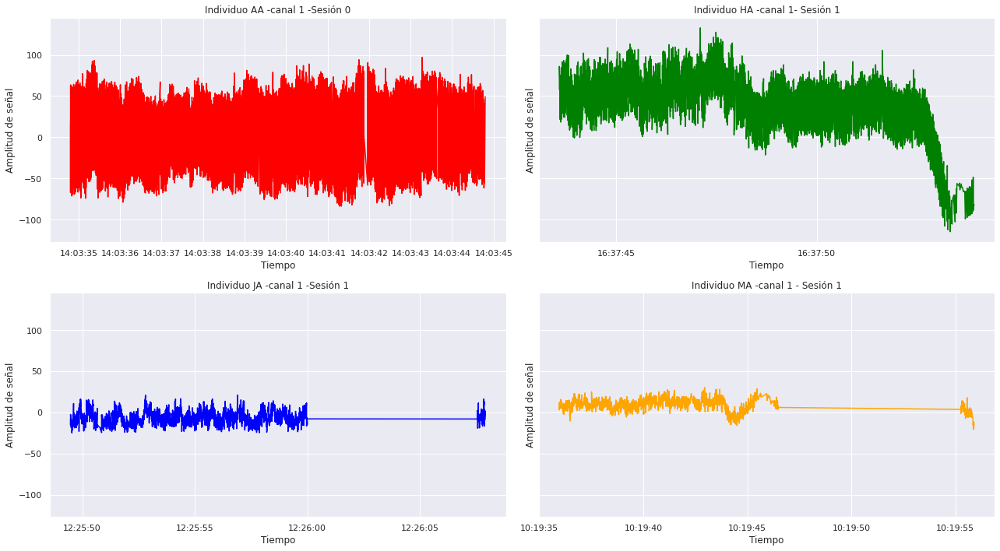

In [45]:
# Ploteamos 2000 registros
fig, axs = plt.subplots(2, 2,figsize=(18, 10),sharex=False,sharey=True)
num_muestras = 2000
axs[0, 0].plot( df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal1_norm"].iloc[0:num_muestras],  color=color_ch1)
axs[0, 0].set_title('Individuo AA -canal 1 -Sesión 0')

axs[0, 1].plot( df_HA1["marca_temporal"].iloc[0:num_muestras],df_HA1["canal1_norm"].iloc[0:num_muestras],  color=color_ch2)
axs[0, 1].set_title('Individuo HA -canal 1- Sesión 1')

axs[1, 0].plot( df_JA1["marca_temporal"].iloc[0:num_muestras],df_JA1["canal1_norm"].iloc[0:num_muestras], color=color_ch3)
axs[1, 0].set_title('Individuo JA -canal 1 -Sesión 1')

axs[1, 1].plot( df_MA1["marca_temporal"].iloc[0:num_muestras],df_MA1["canal1_norm"].iloc[0:num_muestras], color=color_ch4)
axs[1, 1].set_title('Individuo MA -canal 1 - Sesión 1')

for ax in axs.flat:
    ax.set(xlabel='Tiempo', ylabel='Amplitud de señal')

plt.tight_layout()

### **Un mismo canal - mismo sujeto en diferentes sesiones**

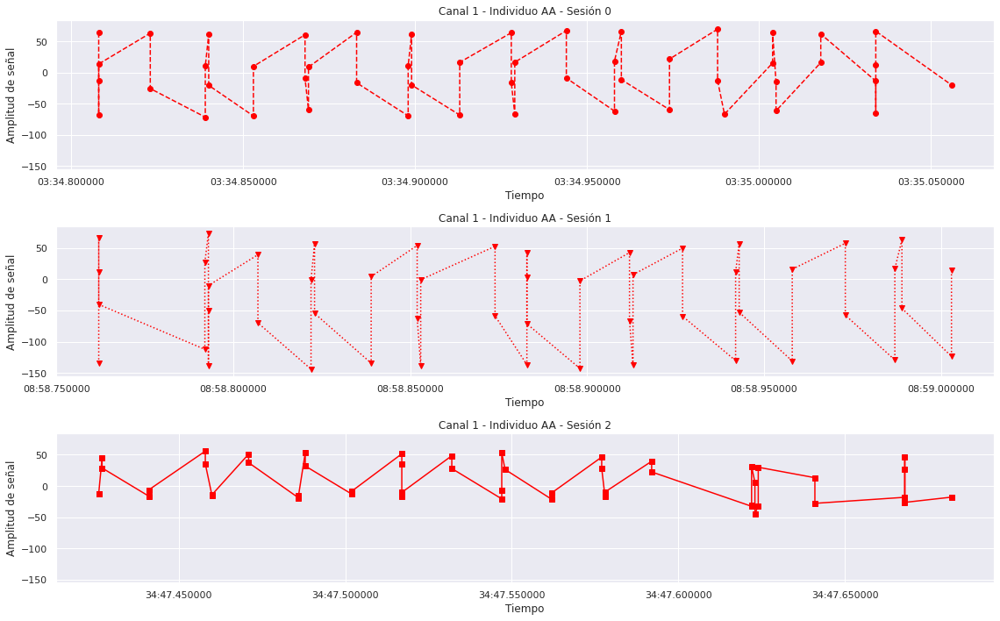

In [46]:
num_muestras = 50
fig, axs = plt.subplots(3,figsize=(16, 10),sharex=False,sharey=True)
axs[0].plot(df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal1_norm"].iloc[0:num_muestras], marker='o',linestyle='--', color=color_ch1)
axs[0].set_title('Canal 1 - Individuo AA - Sesión 0')

axs[1].plot(df_AA1["marca_temporal"].iloc[0:num_muestras],df_AA1["canal1_norm"].iloc[0:num_muestras], marker='v',linestyle=':', color=color_ch1)
axs[1].set_title('Canal 1 - Individuo AA - Sesión 1')

axs[2].plot(df_AA2["marca_temporal"].iloc[0:num_muestras],df_AA2["canal1_norm"].iloc[0:num_muestras], marker='s',linestyle='-',color=color_ch1)
axs[2].set_title('Canal 1 - Individuo AA - Sesión 2')

for ax in axs.flat:
    ax.set(xlabel='Tiempo', ylabel='Amplitud de señal')

plt.tight_layout()

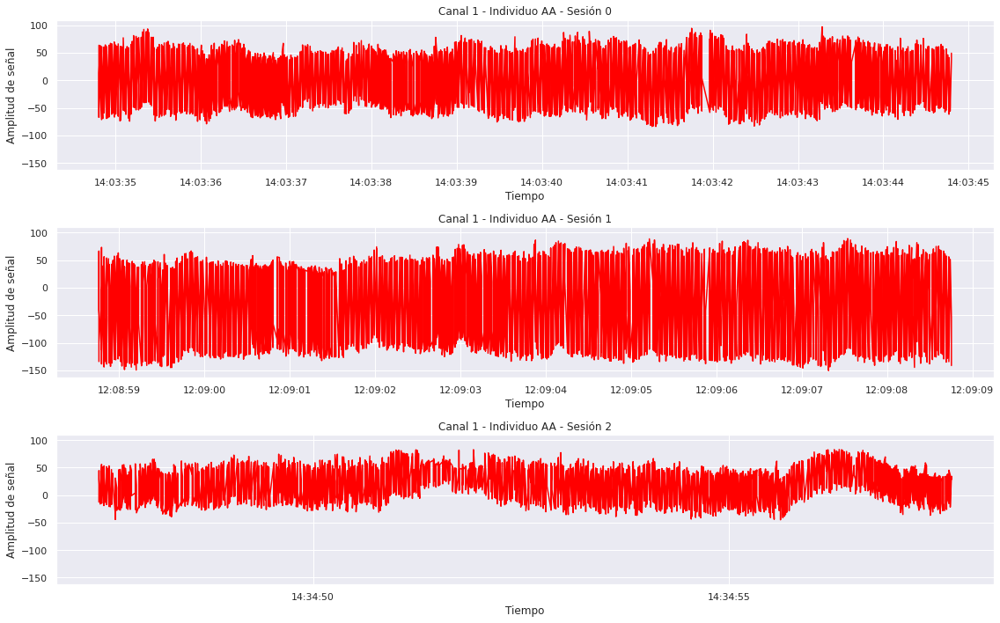

In [47]:
# 2000 muestras
num_muestras = 2000
fig, axs = plt.subplots(3,figsize=(16, 10),sharex=False,sharey=True)
axs[0].plot(df_AA0["marca_temporal"].iloc[0:num_muestras],df_AA0["canal1_norm"].iloc[0:num_muestras],  color=color_ch1)
axs[0].set_title('Canal 1 - Individuo AA - Sesión 0')

axs[1].plot(df_AA1["marca_temporal"].iloc[0:num_muestras],df_AA1["canal1_norm"].iloc[0:num_muestras],  color=color_ch1)
axs[1].set_title('Canal 1 - Individuo AA - Sesión 1')

axs[2].plot(df_AA2["marca_temporal"].iloc[0:num_muestras],df_AA2["canal1_norm"].iloc[0:num_muestras], color=color_ch1)
axs[2].set_title('Canal 1 - Individuo AA - Sesión 2')

for ax in axs.flat:
    ax.set(xlabel='Tiempo', ylabel='Amplitud de señal')

plt.tight_layout()

### **Un mismo sujeto y canal - diferentes estados**

Diferentes estados, se refiere a las dos etiquetas posibles:
- 1: para la luz parpadeante a 12,5 Hz;
- 2: para la luz parpadeante a 16,5 Hz.

Se elige graficar el individuo 'AA', sesión '0', canal 1.

In [48]:
# Se guardan los valores de los índices de cada etiqueta del mismo individuo en variables
etiqueta_1_AA0=df_AA0[df_AA0['etiqueta']==1].index
etiqueta_2_AA0=df_AA0[df_AA0['etiqueta']==2].index

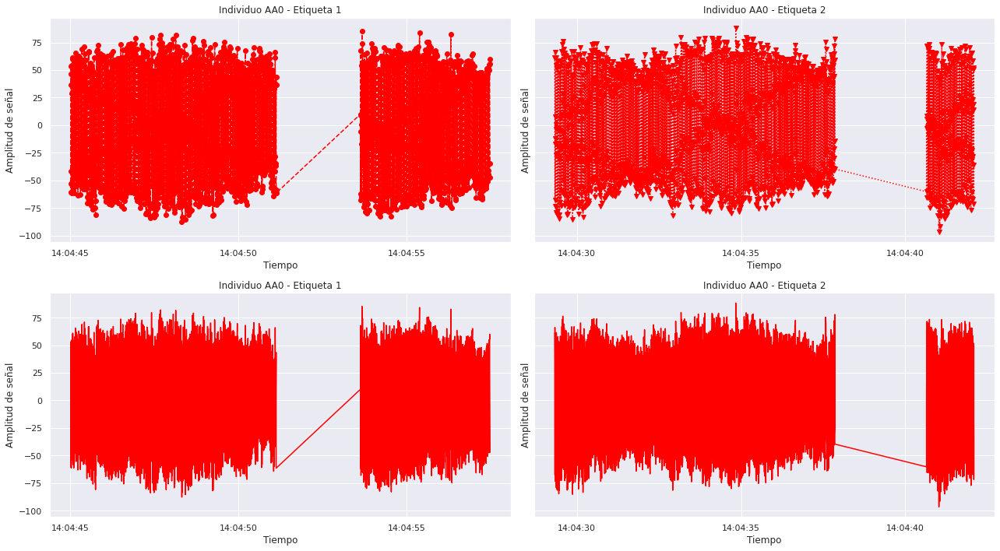

In [49]:
num_muestras = 2000
fig, axs = plt.subplots(2, 2,figsize=(18, 10),sharex=False,sharey=True)
axs[0, 0].plot(df_AA0["marca_temporal"].iloc[etiqueta_1_AA0[0:num_muestras]],df_AA0["canal1_norm"].iloc[etiqueta_1_AA0[0:num_muestras]],marker='o',linestyle='--', color=color_ch1)
axs[0, 0].set_title('Individuo AA0 - Etiqueta 1')

axs[0, 1].plot(df_AA0["marca_temporal"].iloc[etiqueta_2_AA0[0:num_muestras]],df_AA0["canal1_norm"].iloc[etiqueta_2_AA0[0:num_muestras]],marker='v',linestyle=':',  color=color_ch1)
axs[0, 1].set_title('Individuo AA0 - Etiqueta 2')

num_muestras = 2000
axs[1, 0].plot(df_AA0["marca_temporal"].iloc[etiqueta_1_AA0[0:num_muestras]],df_AA0["canal1_norm"].iloc[etiqueta_1_AA0[0:num_muestras]], color=color_ch1)
axs[1, 0].set_title('Individuo AA0 - Etiqueta 1')

axs[1, 1].plot(df_AA0["marca_temporal"].iloc[etiqueta_2_AA0[0:num_muestras]],df_AA0["canal1_norm"].iloc[etiqueta_2_AA0[0:num_muestras]], color=color_ch1)
axs[1, 1].set_title('Individuo AA0 - Etiqueta 2')

for ax in axs.flat:
    ax.set(xlabel='Tiempo', ylabel='Amplitud de señal')

plt.tight_layout()

### **Mismo estado - diferentes sujetos**

Se elije graficar la etiqueta 1 para los 4 diferentes sujetos (canal 1).

In [50]:
etiqueta = 1
etiqueta_1_AA0=df_AA0[df_AA0['etiqueta']==etiqueta].index
etiqueta_1_AA1=df_AA1[df_AA1['etiqueta']==etiqueta].index
etiqueta_1_AA2=df_AA2[df_AA2['etiqueta']==etiqueta].index
etiqueta_1_JA1=df_JA1[df_JA1['etiqueta']==etiqueta].index
etiqueta_1_JA2=df_JA2[df_JA2['etiqueta']==etiqueta].index
etiqueta_1_HA1=df_HA1[df_HA1['etiqueta']==etiqueta].index
etiqueta_1_MA1=df_MA1[df_MA1['etiqueta']==etiqueta].index

etiqueta = 2
etiqueta_2_AA0=df_AA0[df_AA0['etiqueta']==etiqueta].index
etiqueta_2_AA1=df_AA1[df_AA1['etiqueta']==etiqueta].index
etiqueta_2_AA2=df_AA2[df_AA2['etiqueta']==etiqueta].index
etiqueta_2_JA1=df_JA1[df_JA1['etiqueta']==etiqueta].index
etiqueta_2_JA2=df_JA2[df_JA2['etiqueta']==etiqueta].index
etiqueta_2_HA1=df_HA1[df_HA1['etiqueta']==etiqueta].index
etiqueta_2_MA1=df_MA1[df_MA1['etiqueta']==etiqueta].index

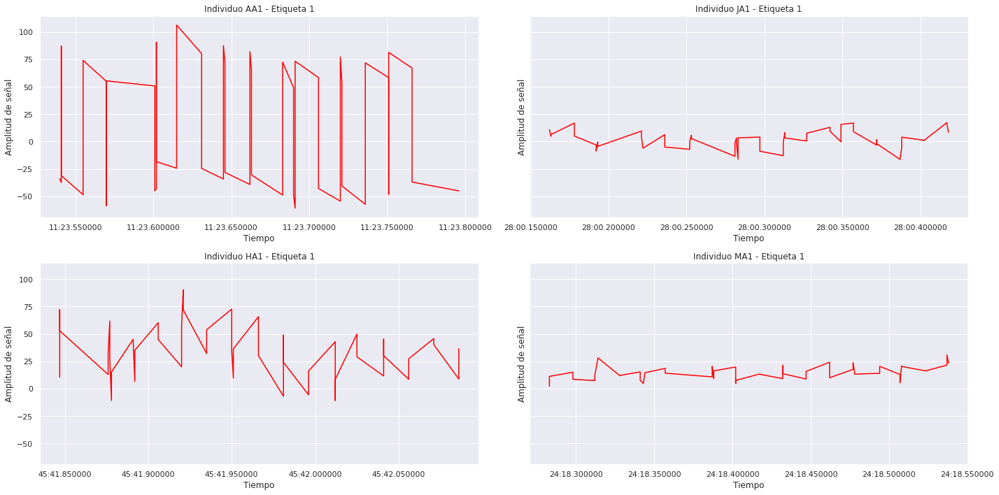

In [51]:
num_muestras = 50
fig, axs = plt.subplots(2, 2,figsize=(20, 10),sharex=False,sharey=True)
axs[0, 0].plot( df_AA1["marca_temporal"].iloc[etiqueta_1_AA1[0:num_muestras]],df_AA1["canal1_norm"].iloc[etiqueta_1_AA1[0:num_muestras]], color=color_ch1)
axs[0, 0].set_title('Individuo AA1 - Etiqueta 1')

axs[0, 1].plot(df_JA1["marca_temporal"].iloc[etiqueta_1_JA1[0:num_muestras]],df_JA1["canal1_norm"].iloc[etiqueta_1_JA1[0:num_muestras]], color=color_ch1)
axs[0, 1].set_title('Individuo JA1 - Etiqueta 1')

axs[1, 0].plot(df_HA1["marca_temporal"].iloc[etiqueta_1_HA1[0:num_muestras]],df_HA1["canal1_norm"].iloc[etiqueta_1_HA1[0:num_muestras]], color=color_ch1)
axs[1, 0].set_title('Individuo HA1 - Etiqueta 1')

axs[1, 1].plot(df_MA1["marca_temporal"].iloc[etiqueta_1_MA1[0:num_muestras]],df_MA1["canal1_norm"].iloc[etiqueta_1_MA1[0:num_muestras]], color=color_ch1)
axs[1, 1].set_title('Individuo MA1 - Etiqueta 1')

for ax in axs.flat:
    ax.set(xlabel='Tiempo', ylabel='Amplitud de señal')

plt.tight_layout()

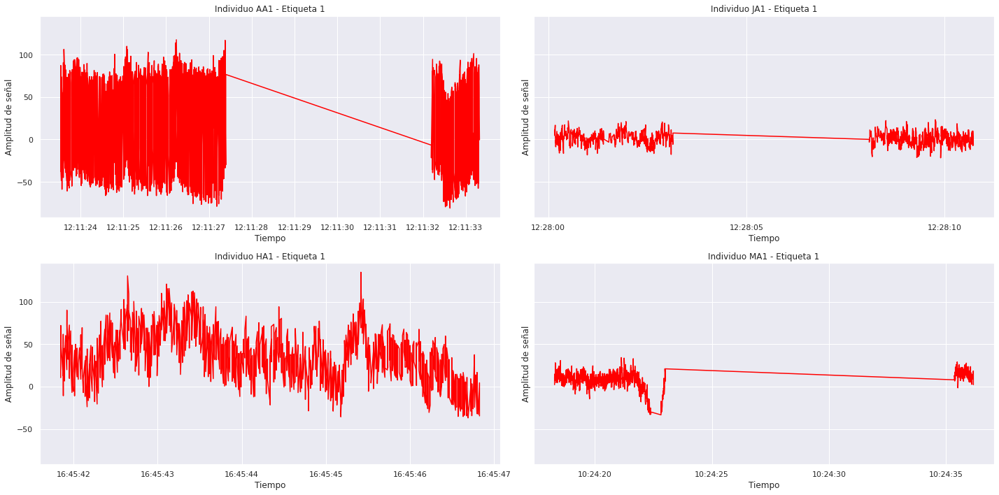

In [52]:
num_muestras = 1000
fig, axs = plt.subplots(2, 2,figsize=(20, 10),sharex=False,sharey=True)
axs[0, 0].plot( df_AA1["marca_temporal"].iloc[etiqueta_1_AA1[0:num_muestras]],df_AA1["canal1_norm"].iloc[etiqueta_1_AA1[0:num_muestras]], color=color_ch1)
axs[0, 0].set_title('Individuo AA1 - Etiqueta 1')

axs[0, 1].plot(df_JA1["marca_temporal"].iloc[etiqueta_1_JA1[0:num_muestras]],df_JA1["canal1_norm"].iloc[etiqueta_1_JA1[0:num_muestras]], color=color_ch1)
axs[0, 1].set_title('Individuo JA1 - Etiqueta 1')

axs[1, 0].plot(df_HA1["marca_temporal"].iloc[etiqueta_1_HA1[0:num_muestras]],df_HA1["canal1_norm"].iloc[etiqueta_1_HA1[0:num_muestras]], color=color_ch1)
axs[1, 0].set_title('Individuo HA1 - Etiqueta 1')

axs[1, 1].plot(df_MA1["marca_temporal"].iloc[etiqueta_1_MA1[0:num_muestras]],df_MA1["canal1_norm"].iloc[etiqueta_1_MA1[0:num_muestras]], color=color_ch1)
axs[1, 1].set_title('Individuo MA1 - Etiqueta 1')

for ax in axs.flat:
    ax.set(xlabel='Tiempo', ylabel='Amplitud de señal')

plt.tight_layout()

Al analizar estas visualizaciones no se observan grandes patrones para extraer información de las mismas. Las señales en el tiempo muestran la amplitud de la señal y la forma de onda.
Con esto podemos determinar la diferencia de amplitud que tienen las distintas personas siendo mayor el individuo AA que el MA por ejemplo.
Si la señal es positiva o negativa creemos que no tiene mucha relevancia ya que eso depende de cómo esté dispuesto el electrodo en función de la señal, ya que la dirección de la misma va a depender su signo.

Como conclucion el analisis y exploracion en el tiempo, nos brinda informacion de outlier, nos permitio detectar que exisitia un artefacto que impactaba en los datos recolectados. Tambien pudimos concluir respecto a la relacion que tenian las variables y elegir como trabajarlas.


# Parte II: Dominio del tiempo.

#### **A) Nivel Segmento/Estado: Seleccione los datos correspondientes a un paciente y un canal, y para él defina un conjunto de señales para cada estado presente en el dataset. Para cada uno de ellos estudie los siguientes elementos y luego compárelos.**

##### a) ¿Presenta los valores de voltaje una distribución normal? Utilizar un criterio gráfico y un test para probarlo. Si la distribución normal no se ajusta, ¿a qué distribución se asemejan?

##### b) Realice un resumen estadístico de los valores de voltaje en el intervalo de tiempo considerado. ¿Qué estimador de posición central usaría para describir los valores? ¿Y de dispersión?

##### c) En adición a los datos dañados encontrados en la parte I, ¿Encuentra outliers a este nivel de análisis? ¿Estos outliers deberían ser tratados de forma diferencial? ¿De qué manera?

##### d) ¿Existe una diferencia estadísticamente significativa para considerar que los estimadores de posición central son diferentes entre los estados? Use un test de hipótesis para probarlo al menos entre dos estados.

##### e) Resuma las principales conclusiones de este nivel de análisis.

Se analizan las distribuciones de todos los individuos, sesiones, canales y etiquetas.
Se elige el paciente HA (sesión 1), canal 3 => Definir un conjunto de señales para etiqueta 1 y para etiqueta 2.

test de hipotesis para ver normalidad shapiro intervalo 1 etiq 1 (0.9941160678863525, 3.8652885336887266e-07)
test de hipotesis para ver normalidad normal_test intervalo 1 etiq 1 NormaltestResult(statistic=24.828621009639097, pvalue=4.060069343488381e-06)

test de hipotesis para ver normalidad shapiro intervalo 1 etiq 2 (0.9919178485870361, 4.474610459936912e-09)
test de hipotesis para ver normalidad normal_test intervalo 1 etiq 2 NormaltestResult(statistic=23.158045516384387, pvalue=9.360397895342006e-06)

test de hipotesis para ver normalidad shapiro intervalo 2 etiq 1 (0.9150559902191162, 4.3011931921234665e-32)
test de hipotesis para ver normalidad normal_test intervalo 2 etiq 1 NormaltestResult(statistic=324.5527432070845, pvalue=3.3440077039579404e-71)

test de hipotesis para ver normalidad shapiro intervalo 2 etiq 2 (0.9729470610618591, 5.584358353891431e-19)
test de hipotesis para ver normalidad normal_test intervalo 2 etiq 2 NormaltestResult(statistic=94.0355256368617, pvalue=

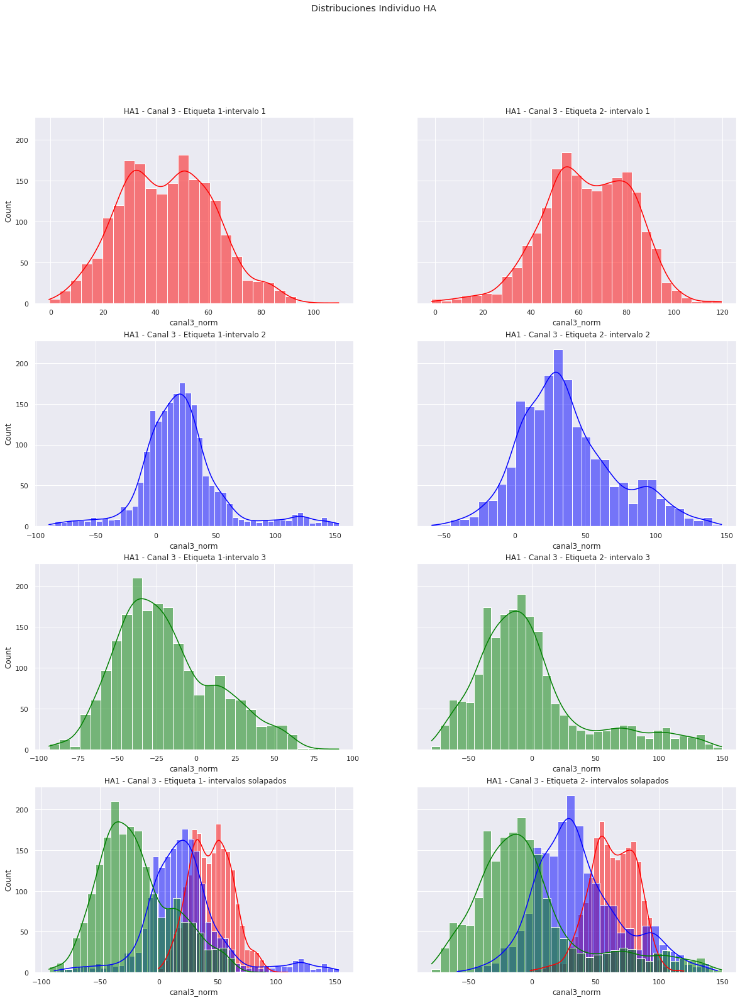

In [53]:
#grafico distintos intervalo HA un mismo canal 
fig, axes = plt.subplots(4, 2, figsize=(20, 25), sharey=True)
fig.suptitle('Distribuciones Individuo HA')


muestras=2000
canal = "canal3_norm"
color_ch = color_ch1
sns.histplot(ax=axes[0, 0], x=df_HA1[canal].iloc[etiqueta_1_HA1[0:muestras]],kde=True, color=color_ch)
axes[0, 0].set_title("\n\n HA1 - Canal 3 - Etiqueta 1-intervalo 1")
sns.histplot(ax=axes[0, 1], x=df_HA1[canal].iloc[etiqueta_2_HA1[0:muestras]],kde=True, color=color_ch)
axes[0, 1].set_title("\n\n HA1 - Canal 3 - Etiqueta 2- intervalo 1")
print('test de hipotesis para ver normalidad shapiro intervalo 1 etiq 1', scipy.stats.shapiro(df_HA1[canal].iloc[etiqueta_1_HA1[0:muestras]]))
print('test de hipotesis para ver normalidad normal_test intervalo 1 etiq 1', scipy.stats.normaltest(df_HA1[canal].iloc[etiqueta_1_HA1[0:muestras]]))
print()
print('test de hipotesis para ver normalidad shapiro intervalo 1 etiq 2', scipy.stats.shapiro(df_HA1[canal].iloc[etiqueta_2_HA1[0:muestras]]))
print('test de hipotesis para ver normalidad normal_test intervalo 1 etiq 2', scipy.stats.normaltest(df_HA1[canal].iloc[etiqueta_2_HA1[0:muestras]]))
print()


color_ch = color_ch3
sns.histplot(ax=axes[1, 0], x=df_HA1[canal].iloc[etiqueta_1_HA1[muestras:4000]],kde=True, color=color_ch)
axes[1, 0].set_title("\n\n HA1 - Canal 3 - Etiqueta 1-intervalo 2")
sns.histplot(ax=axes[1, 1], x=df_HA1[canal].iloc[etiqueta_2_HA1[muestras:4000]],kde=True, color=color_ch)
axes[1, 1].set_title("\n\n HA1 - Canal 3 - Etiqueta 2- intervalo 2")
print('test de hipotesis para ver normalidad shapiro intervalo 2 etiq 1', scipy.stats.shapiro(df_HA1[canal].iloc[etiqueta_1_HA1[muestras:4000]]))
print('test de hipotesis para ver normalidad normal_test intervalo 2 etiq 1', scipy.stats.normaltest(df_HA1[canal].iloc[etiqueta_1_HA1[muestras:4000]]))
print()
print('test de hipotesis para ver normalidad shapiro intervalo 2 etiq 2', scipy.stats.shapiro(df_HA1[canal].iloc[etiqueta_2_HA1[muestras:4000]]))
print('test de hipotesis para ver normalidad normal_test intervalo 2 etiq 2', scipy.stats.normaltest(df_HA1[canal].iloc[etiqueta_2_HA1[muestras:4000]]))
print()


color_ch = color_ch2
sns.histplot(ax=axes[2, 0], x=df_HA1[canal].iloc[etiqueta_1_HA1[muestras*2:6000]],kde=True, color=color_ch)
axes[2, 0].set_title("\n\n HA1 - Canal 3 - Etiqueta 1-intervalo 3")
sns.histplot(ax=axes[2, 1], x=df_HA1[canal].iloc[etiqueta_2_HA1[muestras*2:6000]],kde=True, color=color_ch)
axes[2, 1].set_title("\n\n HA1 - Canal 3 - Etiqueta 2- intervalo 3")
print('test de hipotesis para ver normalidad shapiro intervalo 3 etiq 1', scipy.stats.shapiro(df_HA1[canal].iloc[etiqueta_1_HA1[muestras*2:6000]]))
print('test de hipotesis para ver normalidad normal_test intervalo 3 etiq 1', scipy.stats.normaltest(df_HA1[canal].iloc[etiqueta_1_HA1[muestras*2:6000]]))
print()
print('test de hipotesis para ver normalidad shapiro intervalo 3 etiq 2', scipy.stats.shapiro(df_HA1[canal].iloc[etiqueta_2_HA1[muestras*2:6000]]))
print('test de hipotesis para ver normalidad normal_test intervalo 3 etiq 2', scipy.stats.normaltest(df_HA1[canal].iloc[etiqueta_2_HA1[muestras*2:6000]]))
print()

color_ch = color_ch1
sns.histplot(ax=axes[3, 0], x=df_HA1[canal].iloc[etiqueta_1_HA1[0:muestras]],kde=True, color=color_ch)
#axes[0, 0].set_title("\n\n HA1 - Canal 3 - Etiqueta 1")
sns.histplot(ax=axes[3, 1], x=df_HA1[canal].iloc[etiqueta_2_HA1[0:muestras]],kde=True, color=color_ch)
#axes[0, 1].set_title("\n\n HA1 - Canal 3 - Etiqueta 2")

color_ch = color_ch3
sns.histplot(ax=axes[3, 0], x=df_HA1[canal].iloc[etiqueta_1_HA1[muestras:4000]],kde=True, color=color_ch)
axes[3, 0].set_title("\n\n HA1 - Canal 3 - Etiqueta 1- intervalos solapados")
sns.histplot(ax=axes[3, 1], x=df_HA1[canal].iloc[etiqueta_2_HA1[muestras:4000]],kde=True, color=color_ch)
axes[3, 1].set_title("\n\n HA1 - Canal 3 - Etiqueta 2- intervalos solapados")

color_ch = color_ch2
sns.histplot(ax=axes[3, 0], x=df_HA1[canal].iloc[etiqueta_1_HA1[muestras*2:6000]],kde=True, color=color_ch)
#axes[2, 0].set_title("\n\n HA1 - Canal 3 - Etiqueta 1-intervalo 3")
sns.histplot(ax=axes[3, 1], x=df_HA1[canal].iloc[etiqueta_2_HA1[muestras*2:6000]],kde=True, color=color_ch)
#axes[2, 1].set_title("\n\n HA1 - Canal 3 - Etiqueta 2- intervalo 3")


In [54]:
#calculo estadisticos de posicion central y dispersion para el canal 3 del individuo HA segundo intervalo

canal = "canal3_norm"

print('media de la muestra tomada etiqueta 1 ',df_HA1[canal].iloc[etiqueta_1_HA1[2000:4000]].mean())
print('mediana de la muestra tomada etiqueta 1 ',df_HA1[canal].iloc[etiqueta_1_HA1[2000:4000]].median())
print('desvio estandar de la muestra tomada etiqueta 1 ',df_HA1[canal].iloc[etiqueta_1_HA1[4000:6000]].std())
print()
print('media de la muestra tomada etiqueta 2 ',df_HA1[canal].iloc[etiqueta_2_HA1[2000:4000]].mean())
print('mediana de la muestra tomada etiqueta 2 ',df_HA1[canal].iloc[etiqueta_2_HA1[2000:4000]].median())
print('desvio estandar de la muestra tomada etiqueta 2 ',df_HA1[canal].iloc[etiqueta_2_HA1[2000:4000]].std())

media de la muestra tomada etiqueta 1  21.32282680191701
mediana de la muestra tomada etiqueta 1  18.81103682522246
desvio estandar de la muestra tomada etiqueta 1  31.280236398258673

media de la muestra tomada etiqueta 2  36.75158428130026
mediana de la muestra tomada etiqueta 2  31.38757690791158
desvio estandar de la muestra tomada etiqueta 2  34.128357562386434


In [55]:
#calculo un intervalo para la diferencia de medias
muestras=2000
canal='canal3_norm'
alpha=0.05
def calcEst(groupA, groupB, alpha):
  meanA = groupA.mean()
  meanB = groupB.mean()
  desv_standA = groupA.std()
  desv_standB = groupB.std()
  n_A = len(groupA)
  n_B = len(groupB)
  dif_means = meanA - meanB
  varA = groupA.var()
  varB = groupB.var()
  dif_desv_nA = varA / n_A
  dif_desv_nB = varB / n_B
  raiz_ABsum = math.sqrt(dif_desv_nA + dif_desv_nB)
  interv_conf_sum = dif_means + (scipy.stats.norm.ppf((1-alpha/2)) * raiz_ABsum)
  interv_conf_rest = dif_means - (scipy.stats.norm.ppf((1-alpha/2)) * raiz_ABsum)
  print('Diferencia entre la media del grupo A y B: ', dif_means)
  print('El intervalo de confianza va entre: ' ,interv_conf_rest," - ",interv_conf_sum)
  print('El estadístico es: ', dif_means/raiz_ABsum)

calcEst(df_HA1[canal].iloc[etiqueta_1_HA1[2000:4000]], df_HA1[canal].iloc[etiqueta_2_HA1[2000:4000]], alpha)
calcEst(df_HA1[canal].iloc[etiqueta_1_HA1[0:2000]], df_HA1[canal].iloc[etiqueta_2_HA1[0:2000]], alpha)

Diferencia entre la media del grupo A y B:  -15.42875747938325
El intervalo de confianza va entre:  -17.567701287292646  -  -13.289813671473857
El estadístico es:  -14.13772950648506
Diferencia entre la media del grupo A y B:  -19.366747315539428
El intervalo de confianza va entre:  -20.49343206075317  -  -18.240062570325684
El estadístico es:  -33.690104882838405


In [56]:
#para hacer el test de hipotesis de diferencia de medias
scipy.stats.ttest_ind(df_HA1[canal].iloc[etiqueta_1_HA1[2000:4000]], df_HA1[canal].iloc[etiqueta_2_HA1[2000:4000]], equal_var=False)

Ttest_indResult(statistic=-14.137729506484996, pvalue=2.55952239341677e-44)

In [57]:
scipy.stats.ttest_ind(df_HA1[canal].iloc[etiqueta_1_HA1[0:2000]], df_HA1[canal].iloc[etiqueta_2_HA1[0:2000]], equal_var=False)

Ttest_indResult(statistic=-33.69010488283825, pvalue=3.403229150304824e-219)

#### B) Nivel Paciente - un canal: Seleccione los datos correspondientes a un paciente y un canal de adquisición y para ese caso estudie los siguientes elementos:

##### a) Considere el conjunto completo de valores de voltaje correspondientes a cada uno de los estados a lo largo de todo el registro y repita los elementos del apartado II-A).

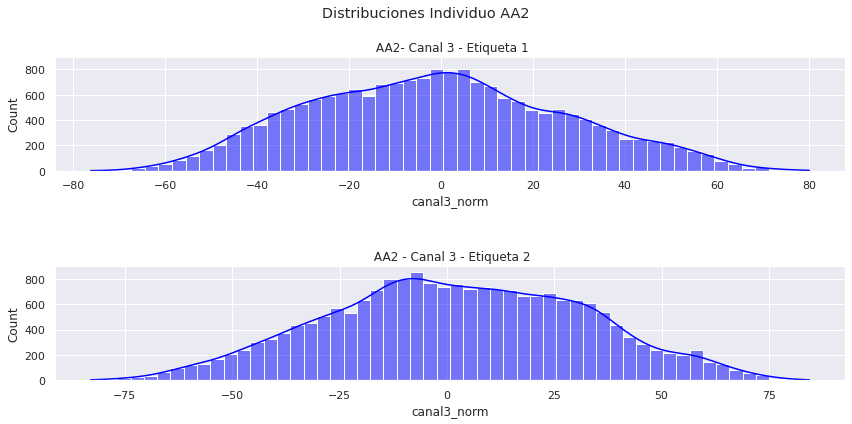

In [58]:
# Paciente:AA2 
# Canal: 3
# Cada uno de los estados a lo largo de todo el registro (ambos canales)
# Se grafica la distribución de los valores de voltaje

canal = "canal3_norm"
color_ch = color_ch3
df_muestra1 = df_AA2[df_AA2['etiqueta']==1][canal]
df_muestra2 = df_AA2[df_AA2['etiqueta']==2][canal]

fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharey=True)
fig.suptitle('Distribuciones Individuo AA2')

sns.histplot(ax=axes[0], x=df_muestra1,kde=True, color=color_ch)
axes[0].set_title("\n\n AA2- Canal 3 - Etiqueta 1")

sns.histplot(ax=axes[1], x=df_muestra2,kde=True, color=color_ch)
axes[1].set_title("\n\n AA2 - Canal 3 - Etiqueta 2")

plt.tight_layout()

**¿Presenta los valores de voltaje una distribución normal? Utilizar un criterio gráfico y un test para probarlo. Si la distribución normal no se ajusta, ¿a qué distribución se asemejan?**

TBD

Antes de restar la línea de tendencia:

Viendo el gráfico para cada estado, vemos en ambos dos "polaridades". Por lo que no podes decir que la distribución completa es explícitamente normal, pero sí que para cada "polaridad" se presentan distribuciones normales o casi normales. Ésto nos permite saber que los valores más probables van a estar entre los 50 y 100 uV en cada polaridad y en cada estado. 

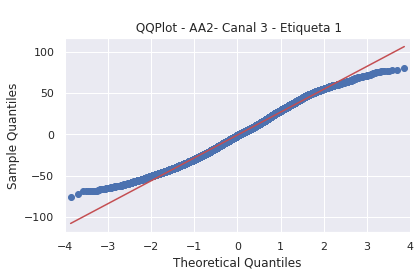

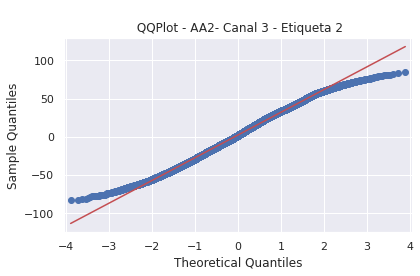

In [59]:
from statsmodels.graphics.gofplots import qqplot

# q-q plot
matplotlib.rc("figure", figsize=(6,4))
qqplot(df_muestra1, line='s')
plt.title("\n QQPlot - AA2- Canal 3 - Etiqueta 1")
plt.tight_layout()
qqplot(df_muestra2, line='s')
plt.title("\n QQPlot - AA2- Canal 3 - Etiqueta 2")
plt.tight_layout()

Utilizando como método gráfico la función qqplot podemos ver si nuestra distribución se ajusta a la distribución normal.
Las desviaciones de los puntos azules respecto de la línea roja en ambos gráficos muestran una desviación de la distribución esperada. Por lo tanto nuestras muestras del Paciente "AA2", "Canal3" para ambos estados, no se ajustan a una distribución normal, pero visualmente se aproxima a una distribución normal, por más que presenta colas que difieren de una normal y por lo tanto los tests rechazan la hipótesis de normalidad.

In [60]:
# Test de DAgostino
# p > alpha: no se rechaza H0, es normal.
# p <= alpha: rechaza H0, no es normal.
# Etiqueta 1
print("Etiqueta 1 de la muestra elegida:")
stat, p = scipy.stats.normaltest(df_muestra1)
print('Estadisticos=%.3f, p=%.3f' % (stat, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal(se rechaza la hipótesis nula H0)')

Etiqueta 1 de la muestra elegida:
Estadisticos=522.288, p=0.000
La muestra no parece Gaussiana o Normal(se rechaza la hipótesis nula H0)


In [61]:
# Test de DAgostino
# p > alpha: no se rechaza H0, es normal.
# p <= alpha: rechaza H0, no es normal.
# Etiqueta 2
print("Etiqueta 2 de la muestra elegida:")
stat, p = scipy.stats.normaltest(df_muestra2)
print('Estadisticos=%.3f, p=%.3f' % (stat, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal(se rechaza la hipótesis nula H0)')

Etiqueta 2 de la muestra elegida:
Estadisticos=415.120, p=0.000
La muestra no parece Gaussiana o Normal(se rechaza la hipótesis nula H0)


De acuerdo a ambos tests de hipótesis, en las muestras elegidas de ambos estados, se obtiene que las muestras no parecen tener una distribución que se ajuste a la normal.

**Realice un resumen estadístico de los valores de voltaje en el intervalo de tiempo considerado. ¿Qué estimador de posición central usaría para describir los valores? ¿Y de dispersión?**

In [62]:
# Estimadores de posición central (media y mediana)
# Etiqueta 1
media = df_muestra1.mean()
print("Etiqueta 1 de la muestra elegida:")
print('Media = %.2f' %  media)
mediana = df_muestra1.median()
print('Mediana = %.2f' %  mediana)
# Etiqueta 2
media = df_muestra2.mean()
print("\nEtiqueta 2 de la muestra elegida:")
print('Media = %.2f' %  media)
mediana = df_muestra2.median()
print('Mediana = %.2f' %  mediana)

Etiqueta 1 de la muestra elegida:
Media = -0.94
Mediana = -1.52

Etiqueta 2 de la muestra elegida:
Media = 2.28
Mediana = 1.95


In [63]:
# Estimadores de dispersión
# Etiqueta 1
print("Etiqueta 1 de la muestra elegida:")
# Varianza
var = df_muestra1.var()
print('Varianza = %.2f' %  var)
# Desviación estándar
std = df_muestra1.std()
print('Desviación Estándar = %.2f' %  std)
# Rango
rango = df_muestra1.max() - df_muestra1.min()
print('Rango = %.2f' %  rango)
# IQR
iqr = df_muestra1.quantile(0.75) - df_muestra1.quantile(0.25)
print('IQR = %.2f' %  iqr)

# Estimadores de dispersión
# Etiqueta 2
print("\nEtiqueta 2 de la muestra elegida:")
# Varianza
var = df_muestra2.var()
print('Varianza = %.2f' %  var)
# Desviación estándar
std = df_muestra2.std()
print('Desviación Estándar = %.2f' %  std)
# Rango
rango = df_muestra2.max() - df_muestra2.min()
print('Rango = %.2f' %  rango)
# IQR
iqr = df_muestra2.quantile(0.75) - df_muestra2.quantile(0.25)
print('IQR = %.2f' %  iqr)

Etiqueta 1 de la muestra elegida:
Varianza = 763.21
Desviación Estándar = 27.63
Rango = 156.31
IQR = 39.76

Etiqueta 2 de la muestra elegida:
Varianza = 883.53
Desviación Estándar = 29.72
Rango = 167.37
IQR = 42.93


In [64]:
# Medias de asimetría
print("Etiqueta 1 de la muestra elegida:")
asimetria = scipy.stats.skew(df_muestra1)
print('Asimetría = %.2f' %  asimetria)
print("\nEtiqueta 2 de la muestra elegida:")
asimetria = scipy.stats.skew(df_muestra2)
print('Asimetría = %.2f' %  asimetria)
# Para valores cercanos a 0, la variable es simétrica. Si es positiva tiene cola a la derecha y si es negativa tiene cola a la izquierda.
# Si la asimetría está entre -0,5 y 0,5, los datos son bastante simétricos
# Si la asimetría está entre -1 y - 0,5 o entre 0,5 y 1, los datos son moderadamente asimétricos
# Si la asimetría es inferior a -1 o superior a 1, los datos están muy sesgados

Etiqueta 1 de la muestra elegida:
Asimetría = 0.17

Etiqueta 2 de la muestra elegida:
Asimetría = -0.01


**¿Encuentra outliers a este nivel de análisis? ¿Estos outliers deberían ser tratados de forma diferencial? ¿De qué manera?**

En los datos restada la línea de tendencia, vemos que los valores de voltaje del canal elegido se encuentra comprendido entre -85, +80, aproximadamente.

count    18521.000
mean        -0.940
std         27.626
min        -76.183
25%        -21.697
50%         -1.518
75%         18.066
max         80.124
Name: canal3_norm, dtype: object

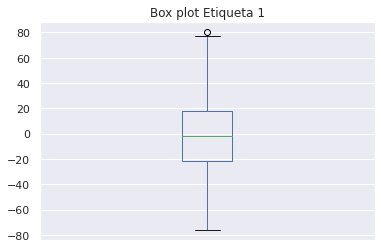

In [65]:
# Boxplots
df_muestra1.plot.box(title="Box plot Etiqueta 1", xticks=[])
df_muestra1.describe().apply(lambda x: format(x, '.3f'))

count    20446.000
mean         2.279
std         29.724
min        -82.960
25%        -18.614
50%          1.947
75%         24.318
max         84.414
Name: canal3_norm, dtype: object

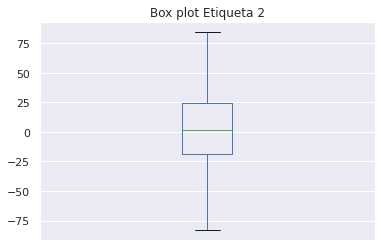

In [66]:
# Boxplots
df_muestra2.plot.box(title="Box plot Etiqueta 2", xticks=[])
df_muestra2.describe().apply(lambda x: format(x, '.3f'))

**¿Existe una diferencia estadísticamente significativa para considerar que los
estimadores de posición central son diferentes entre los estados? Use un test
de hipótesis para probarlo al menos entre dos estados.**

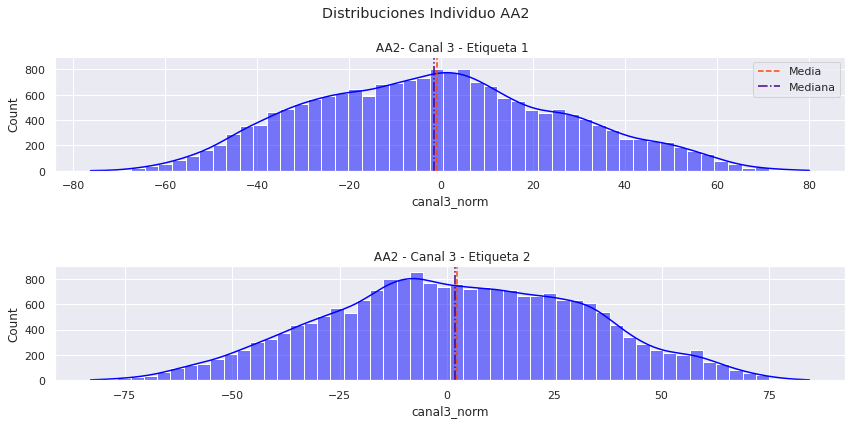

In [67]:
# Paciente:AA2 
# Canal: 3
# Cada uno de los estados a lo largo de todo el registro (ambos canales)
# Se grafica la distribución de los valores de voltaje

fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharey=True)
fig.suptitle('Distribuciones Individuo AA2')

sns.histplot(ax=axes[0], x=df_muestra1,kde=True, color=color_ch)
axes[0].axvline(df_muestra1.mean(), color='orangered',
            linestyle='--', label='Media')
axes[0].axvline(df_muestra1.median(), color='indigo',
            linestyle='-.', label='Mediana')
axes[0].set_title("\n\n AA2- Canal 3 - Etiqueta 1")

sns.histplot(ax=axes[1], x=df_muestra2,kde=True, color=color_ch)
axes[1].axvline(df_muestra2.mean(), color='orangered',
            linestyle='--', label='Media')
axes[1].axvline(df_muestra2.median(), color='indigo',
            linestyle='-.', label='Mediana')
axes[1].set_title("\n\n AA2 - Canal 3 - Etiqueta 2")

axes[0].legend()
plt.tight_layout()

Vemos que si existe una diferencia entre las medidas centrales de media y mediana entre ambas muestras (por estado).
Realizaremos un test de hipótesis sobre la diferencia de medias.

In [68]:
diferencia_de_medias = df_muestra1.mean() - df_muestra2.mean()
print("Diferencia de medias: {:.2f}".format(diferencia_de_medias))

Diferencia de medias: -3.22


In [69]:
# z test de comparación de medias de dos grupos.
# hipotesis nula: las medias muestrales son iguales
# hipotesis alternativa: las medias muestrales son iguales
# the standard deviations of the samples may be different.

cm = sms.CompareMeans(sms.DescrStatsW(df_muestra1), sms.DescrStatsW(df_muestra2))
res = cm.ztest_ind(alternative='two-sided',usevar='unequal', value=0)
print(res)
print('z = %.3f' % res[0])
print('p-value = %.3f \n' % res[1])
alpha = 0.05
if res[1] > alpha:
   print('La media de las muestras parecen iguales (no se rechaza la hipótesis nula H0)')
else:
   print('La media de las muestras no parecen iguales (se rechaza la hipótesis nula H0)')

(-11.08023073065697, 1.564688198139905e-28)
z = -11.080
p-value = 0.000 

La media de las muestras no parecen iguales (se rechaza la hipótesis nula H0)


Como el p-valor (=1.56e-28) < alpha (=0.05); **hay evidencia muestral suficiente para rechazar la $ H_0$ de que las medias de las muestras son iguales**.

##### b) Ahora que dispone de más datos, ¿son variables independientes el estado registrado de la señal y su voltaje? Use herramientas cuantitativas y cualitativas para justificar su respuesta.

La correlación de Pearson asume que las variables aleatorias se distribuyen normalmente, por lo que hay que tenerlo en cuenta a la hora de interpretar los resultados. Alternativamente, puede cambiar la función 'pearsonr' por la función de correlación de rango de Spearman: 'spearmanr', que no asume la normalidad de sus variables.


Las variables NO son estadísticamente independientes (o sea, sí hay asociación entre ellas) cuando: 
- $Cov(X,Y)\neq0$
- $Corr(X,Y)\neq0$
- $Var(X+Y) \neq Var(X)+Var(Y)$
- $E(X.Y) \neq E(X).E(Y)$


Calculemos estos valores para concluir independencia o no entre las variables, para éste punto se utiliza toda la muestra (paciente AA2, Canal3) contemplendo la etiqueta 1 y 2.

In [70]:
# Covarianza
cov_df_AA2 = df_AA2[['canal3', 'etiqueta']].cov()
cov = cov_df_AA2['canal3']['etiqueta']
print("La covarianza entre ambas variables es: %.2f" % cov)

La covarianza entre ambas variables es: -3.00


In [71]:
# Correlación
# Si son independientes, es de esperar que la correlación entre pares de variables sea cercana a cero.
corr_df_AA2 = df_AA2[['canal3', 'etiqueta']].corr(method="spearman")
corr = corr_df_AA2['canal3']['etiqueta']
print("La correlación entre ambas variables es: %.2f" % corr)

La correlación entre ambas variables es: -0.09


In [72]:
# Varianza del canal3
X_var = df_AA2['canal3'].var()

# Varianza del salario bruto
Y_var = df_AA2['etiqueta'].var()

# Varianza conjunta
XY_var = (df_AA2['canal3'] + df_AA2['etiqueta']).var()

# Suma de las varianzas
sum_var = X_var + Y_var

print("Varianza conjunta: %.2f" % XY_var) 
print("Suma de las varianzas: %.2f" % sum_var)

Varianza conjunta: 7128.82
Suma de las varianzas: 7134.82


Vemos que $Var(X+Y) \neq Var(X)+Var(Y)$

In [73]:
# Esperanza del canal 3
X_mean = df_AA2['canal3'].mean()

# Esperanza de las etiquetas
Y_mean = df_AA2['etiqueta'].mean()

# Esperanza conjunta
XY_mean = (df_AA2['canal3'] * df_AA2['etiqueta']).mean()

# Multiplicación de esperanzas
mult_means = X_mean * Y_mean

print("La esperanza conjunta es de: %.2f" % XY_mean)
print("La multiplicación de las esperanzas es: %.2f" % mult_means)

La esperanza conjunta es de: 3119.68
La multiplicación de las esperanzas es: 3122.68


Vemos que $E(X.Y) \neq E(X).E(Y)$

Por lo que concluimos que las variables `canal3` y `etiqueta` en el conjunto de datos de la persona AA2, canal3 no son estadísticamente independientes (o sí tienen asociación).

Pero como vimos la correlación entre ambas variables es cercana a cero, por lo que su asociación es baja (Una correlación cercana a 0 indica que no existe relación lineal entre las variables).

##### c) Para cada uno de los estados, los valores de voltaje a lo largo del tiempo, ¿varían con alguna tendencia?

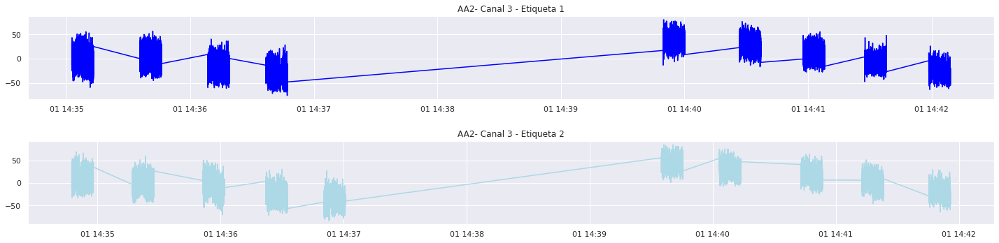

In [74]:
fig, axs = plt.subplots(2, figsize=(20, 5))
axs[0].plot(df_AA2[df_AA2['etiqueta']==1]['marca_temporal'], df_muestra1, color='blue')
axs[0].set_title('AA2- Canal 3 - Etiqueta 1')
axs[1].plot(df_AA2[df_AA2['etiqueta']==2]['marca_temporal'], df_muestra2, color='lightblue')
axs[1].set_title('AA2- Canal 3 - Etiqueta 2')
fig.tight_layout(h_pad=2)

Con los valores de voltaje con su linea de tendencia restada, se observan patrones repetidos entre intervalos de cada etiqueta cuando está encendida la luz de la etiqueta correspondiente. Los intervalos marcados con una linea representan los valores que ehemos eliminados por corresponder a etiqueta 99 (intervalos de no estimulación). No se visualiza una tendencia particular en ambos segmentos.


##### d) Resuma las principales conclusiones de este nivel de análisis.

En base a los análisis realizados, no se logra visualizar una diferencia entre las medias de etiqueta 1 y etiqueta 2. Y concluimos que la variable 'canalX' es independiente de la variable 'etiqueta'.

#### C) Nivel Paciente - multi canal: Seleccione los datos correspondientes a un paciente y para ese caso estudie los siguientes elementos:

##### a) Las señales de voltaje en función de tiempo para cada canal, ¿son variables independientes entre sí? Use herramientas cuantitativas y cualitativas para justificar su respuesta. (Ejemplo, matriz de correlación)

##### b) Tomando los puntos que considere relevantes del apartado II-B) para cada canal y considerando la respuesta anterior. ¿Considera relevante trabajar con todos los canales disponibles o podría quedarse con un subconjunto? Si elige el subconjunto, ¿qué canales elegiría y por qué?c) Opcional: Tomando un par de canales a elección, analice la distribución conjunta de los valores de voltaje para cada estado de forma cualitativa. (Ejemplo, Heatmap, scatterplot, 3D-mesh, etc.)

##### d) Resuma las principales conclusiones de este nivel de análisis.

,canal1_norm,canal2_norm,canal3_norm,canal4_norm
canal1_norm,1.000000,0.754919,0.856848,0.847908
canal2_norm,0.754919,1.000000,0.878986,0.869887
canal3_norm,0.856848,0.878986,1.000000,0.970989
canal4_norm,0.847908,0.869887,0.970989,1.000000


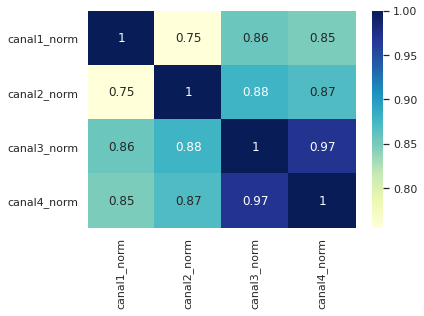

In [75]:
#veo correlacion entre los canales
col = df_HA1[['canal1_norm','canal2_norm','canal3_norm','canal4_norm']]
corr_col=col.corr()
#.corr es una funcion que correlaciona las variables una con otra y luego la grafico con el heatmap de seaborn
sns.heatmap(corr_col, cmap="YlGnBu", annot = True)
sns.set(rc={'figure.figsize':(15,12)})
corr_col

De acuerdo a la informacion que nos proporciona la matriz de correlacion de dichas variables numericas y el grafico heatmap, podemos concluir que si existe una relacion entre las variables canales del 1 al 4. Las Variables no son independientes entre si. Mientras una aumenta la otra también tiende a aumentar y viceversa, por ende se podria elegir un subconjunto de canales.

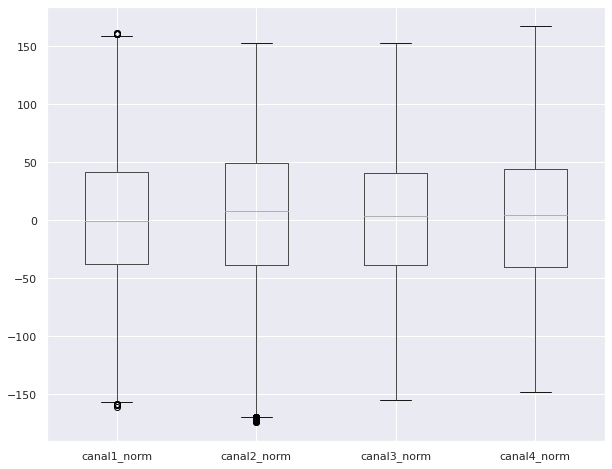

In [76]:
matplotlib.rc("figure", figsize=(10,8))
df_HA1.boxplot(column=['canal1_norm','canal2_norm','canal3_norm','canal4_norm'])

Cuando se grafica la distribución de canales de forma conjunta se observa que mantienen una relacion lineal en los scatter plot y con distribución estadística aproximadamente similares.

Teniendo en cuenta la que existe correlacion entre los canales, podríamos trabajar con un subconjunto. 

Se decide utilizar sólo un canal, viendo los boxplots, vemos que los canales 3 y 4 no tienen valores por fuera de los rangos intercuartílicos, por lo tanto podríamos quedarnos con cualquiera de esos dos.

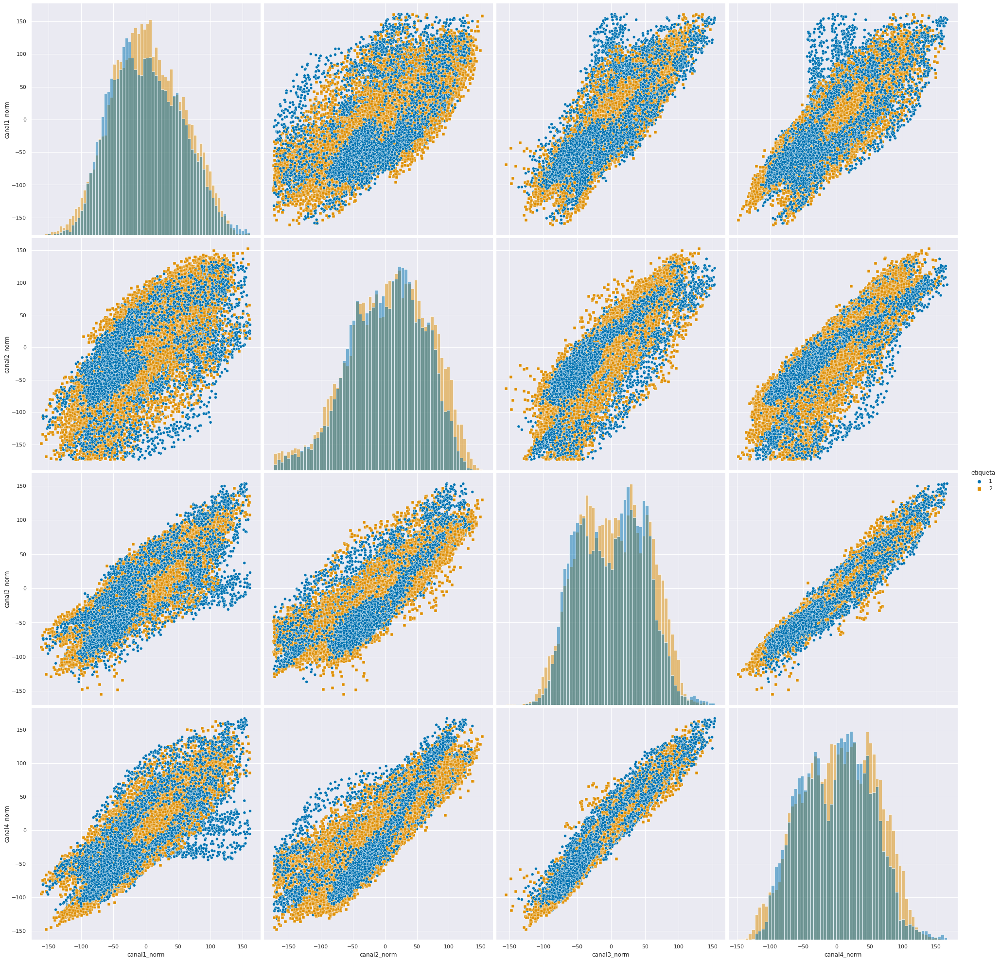

In [77]:
sns.pairplot(
    df_HA1,
    x_vars=['canal1_norm','canal2_norm','canal3_norm','canal4_norm'],
    y_vars=['canal1_norm','canal2_norm','canal3_norm','canal4_norm'],
    hue="etiqueta",
    diag_kind='hist',
    markers=["o", "s"],
    height=7,
    palette='colorblind'
)
#armo una densidad conjunta de los canales dividiendo por estados.

#### D) Nivel Multi-Paciente.

##### a) A partir de las conclusiones extraídas de los niveles de análisis anteriores. Decida cuáles son los aspectos más importantes a analizar de los registros de un paciente y compárelos entre pacientes. ¿Encuentra diferencias significativas? ¿Qué variables pueden identificar esas diferencias? A modo de ejemplo: los valores de voltaje medios para cada estado de un paciente, ¿difieren significativamente entre pacientes?

Respuesta:

Se seleccionaron dos individuos diferentes HA1 y AA0, canal1, y ambas etiquetas para el analisis.


a) De acuerdo a lo observado en graficos de caja, histograma y medidas de centralidad, que en el dominio del tiempo no encontramos informacion relevante que nos permita concluir que existe una diferencia entre los registros obtenidos en los diferentes canales e individuos (sensores) cuando se exita a un individuo con luces de diferentes frecuencia. 
Para mismo individuo, mismo canal distinta etiqueta, no existen diferencias significativas en la amplitud de la señal que nos pueda brindar informacion relevante. Se observa un cambio de amplitud en la señal para individuos diferentes, pero que no estan relacionados al experimento de etimular con luces diferente.
Ademas vale aclarar, teniendo en cuenta el conocimiento de dominio, que los niveles de amplitud de señal en el analisis en el dominio del tiempo dependen tambien de factores externo (como por ejemplo la referencia para las diferencias de potencial varia por cada individuo), por tal motivo no nos brinda demasiada informacion relevante.


Como conclucion el analisis y exploracion en el tiempo, nos brinda informacion de outlier, nos permitio detectar que exisitia un artefacto que impactaba en los datos recolectados. Tambien pudimos concluir respecto a la relacion que tenian las variables y elegir como trabajarlas.

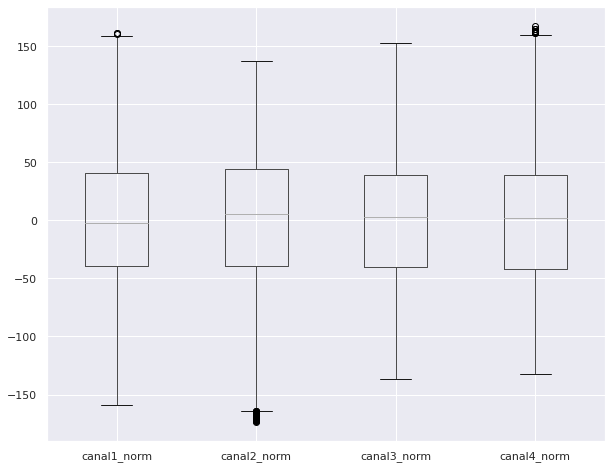

In [78]:
matplotlib.rc("figure", figsize=(10,8))
df_HA1[df_HA1['etiqueta']==1].boxplot(column=['canal1_norm','canal2_norm','canal3_norm','canal4_norm'])

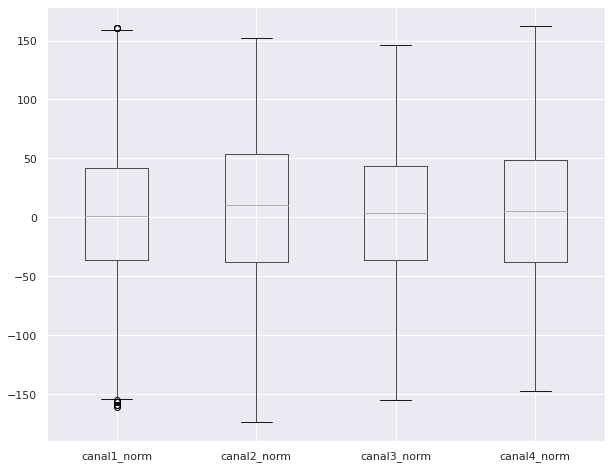

In [79]:
matplotlib.rc("figure", figsize=(10,8))
df_HA1[df_HA1['etiqueta']==2].boxplot(column=['canal1_norm','canal2_norm','canal3_norm','canal4_norm'])

In [80]:
matplotlib.rc("figure", figsize=(10,8))
df_HA1[df_HA1['etiqueta']==1].mean()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  


num_muestra      99.819114
canal1         1983.597232
canal2          981.477335
canal3         1947.416159
canal4         2027.132092
etiqueta          1.000000
sesion            1.000000
canal1_norm       1.030760
canal2_norm       1.699020
canal3_norm       0.372646
canal4_norm      -0.572191
dtype: float64

In [81]:
df_HA1[df_HA1['etiqueta']==2].mean()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  """Entry point for launching an IPython kernel.


num_muestra     100.642027
canal1         1965.662879
canal2          964.944260
canal3         1929.751928
canal4         2008.627758
etiqueta          2.000000
sesion            1.000000
canal1_norm       3.113561
canal2_norm       6.044189
canal3_norm       3.386699
canal4_norm       4.358873
dtype: float64

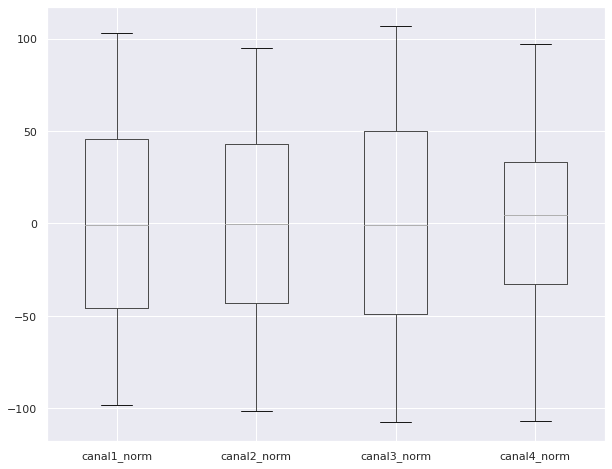

In [82]:
matplotlib.rc("figure", figsize=(10,8))
df_AA0[df_AA0['etiqueta']==1].boxplot(column=['canal1_norm','canal2_norm','canal3_norm','canal4_norm'])

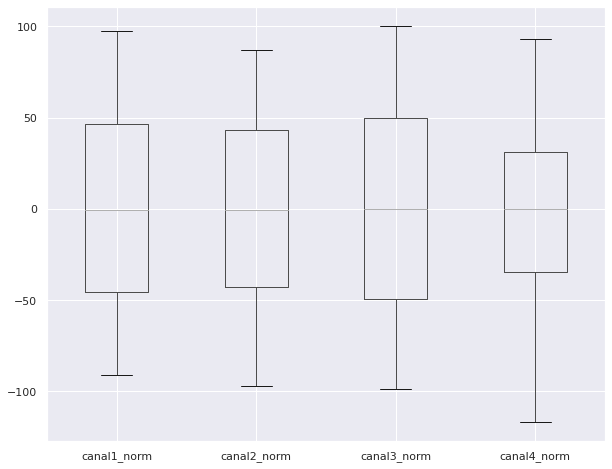

In [83]:
matplotlib.rc("figure", figsize=(10,8))
df_AA0[df_AA0['etiqueta']==2].boxplot(column=['canal1_norm','canal2_norm','canal3_norm','canal4_norm'])

In [84]:
df_AA0[df_AA0['etiqueta']==1].mean()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  """Entry point for launching an IPython kernel.


num_muestra    99.858006
canal1         39.708903
canal2         23.231282
canal3         49.197360
canal4        -25.960205
etiqueta        1.000000
sesion          0.000000
canal1_norm    -0.279600
canal2_norm     0.125560
canal3_norm     0.024323
canal4_norm     1.888683
dtype: float64

In [85]:
df_AA0[df_AA0['etiqueta']==2].mean()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  """Entry point for launching an IPython kernel.


num_muestra    100.184418
canal1          41.107555
canal2          23.762652
canal3          49.589643
canal4         -30.072377
etiqueta         2.000000
sesion           0.000000
canal1_norm      0.279676
canal2_norm     -0.125594
canal3_norm     -0.024330
canal4_norm     -1.889196
dtype: float64

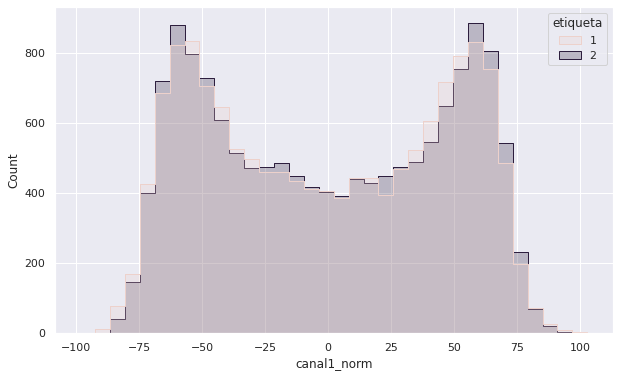

In [86]:
plt.figure(figsize=(10,6))
sns.histplot(df_AA0, x="canal1_norm", hue="etiqueta", element="step")

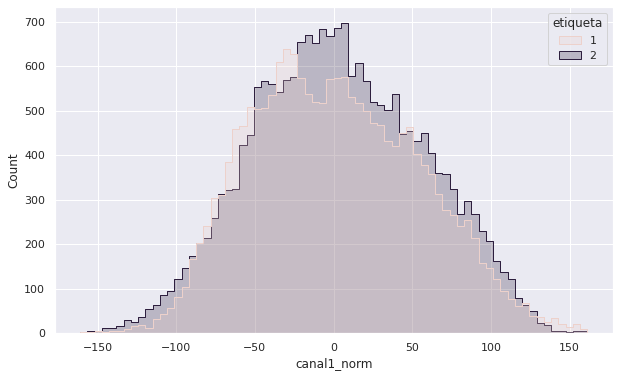

In [87]:
plt.figure(figsize=(10,6))
sns.histplot(df_HA1, x="canal1_norm", hue="etiqueta", element="step")

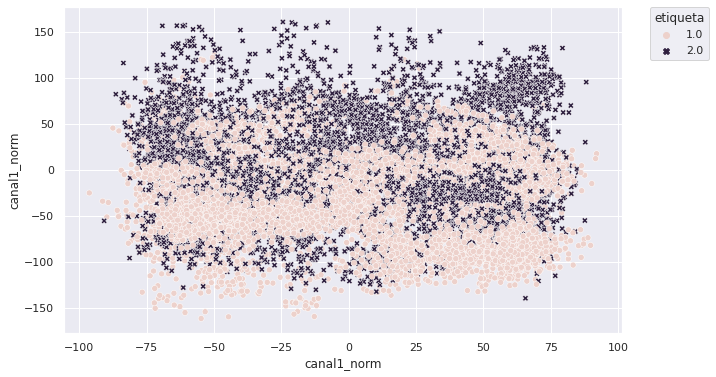

In [88]:
df_aa0=df_AA0['canal1_norm']
df_ha1=df_HA1['canal1_norm']
plt.figure(figsize=(10,6))
sns.scatterplot(data=df,x=df_aa0,y=df_ha1,hue='etiqueta',style='etiqueta')
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0.,title='etiqueta')

**FIN.**